In [937]:
import os
import pandas as pd
import numpy as np
import random
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.tokenize import wordpunct_tokenize
# from nltk.tokenize import sent_tokenize (Tokenization)
from nltk.probability import FreqDist
from nltk.metrics import ConfusionMatrix
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

In [802]:
#abrir arquivo json gerado na raspagem de dados
data = []
with open('notices.txt', errors='ignore') as f:
    for line in f:
        data.append(json.loads(line))

In [803]:
#gerar dataframe
df = pd.DataFrame(data)

In [804]:
#regex para editar a data 
pattern = r'([0-3]?[0-9][\/][0-3]?\d[\/](?:[0-9]{2})?[0-9]{2})'

In [805]:
#criar uma nova coluna com a data modificada
df['data'] = df['data_atualizado'].str.extract(pattern)

In [806]:
#transformar a data em string
df['data'] = df['data'].astype(str)

In [807]:
#transformar em formato de data a coluna "data"
df['data'] = pd.to_datetime(df['data'])

In [808]:
#apagar os valores nulos na coluna 'titulo'
df = df.dropna(subset=['titulo'])

In [809]:
#apagar os valores na coluna 'categoria'
df = df.dropna(subset=['categoria'])

In [841]:
#criar uma classe onde tiver a palavra Economia na coluna categoria vai colunar o numero 1 e onde nao tiver o numero 0
def class_(s):
    if (s['categoria']=='Economia'):
        return 'economia'
    else:
        return 'não é economia'

In [842]:
#criar uma nova coluna aplicando a classe criada anteriormente
df['class_label'] = df.apply(class_, axis=1)

In [843]:
#criar um objeto com os dados da coluna titulo
texto = df['titulo']

In [844]:
#criar um objeto com os dados da coluna class_label
classes = df['class_label']

In [845]:
# Função para remover Stopwords da nossa base:
def RemoveStopWords(instancia):
    stopwords = set(nltk.corpus.stopwords.words('portuguese'))
    palavras = [i for i in instancia.split() if not i in stopwords]
    return (" ".join(palavras))

In [846]:
# Aplicando o stemming em nossa base:
def Stemming(instancia):
    stemmer = nltk.stem.RSLPStemmer()
    palavras = []
    for w in instancia.split():
        palavras.append(stemmer.stem(w))
    return (" ".join(palavras))

In [847]:
def Limpeza_dados(instancia):
    # remove links, pontos, virgulas,ponto e virgulas dos tweets
    instancia = re.sub(r"http\S+", "", instancia).lower().replace('.','').replace(';','').replace('-','').replace(':','').replace(')','')
    return (instancia)

In [848]:
def Preprocessing(instancia):
    instancia = re.sub(r"http\S+", "", instancia).lower().replace('.','').replace(';','').replace('-','').replace(':','').replace(')','').replace('"','')
    stopwords = set(nltk.corpus.stopwords.words('portuguese'))
    palavras = [i for i in instancia.split() if not i in stopwords]
    return (" ".join(palavras))

In [849]:
#tokenizar
tokenizer = RegexpTokenizer(r'\w+')

In [850]:
#tranformar coluna em string
clean_questions['titulo'] = clean_questions['titulo'].astype(str)

In [851]:
# Aplica a função em todos os dados:
texto = [Preprocessing(i) for i in texto]

In [852]:
#clean_questions = clean_questions.dropna(subset=['text'])

In [853]:
all_words = [word for tokens in texto for word in tokens]
sentence_lengths = [len(tokens) for tokens in texto]
VOCAB = sorted(list(set(all_words)))

In [854]:
print("%s Quantidade total de palavras, com um vocabulario de %s" % (len(all_words), len(VOCAB)))

7828264 Quantidade total de palavras, com um vocabulario de 107


In [855]:
print("Tamanho máximo de uma sentença %s" % max(sentence_lengths))

Tamanho máximo de uma sentença 137


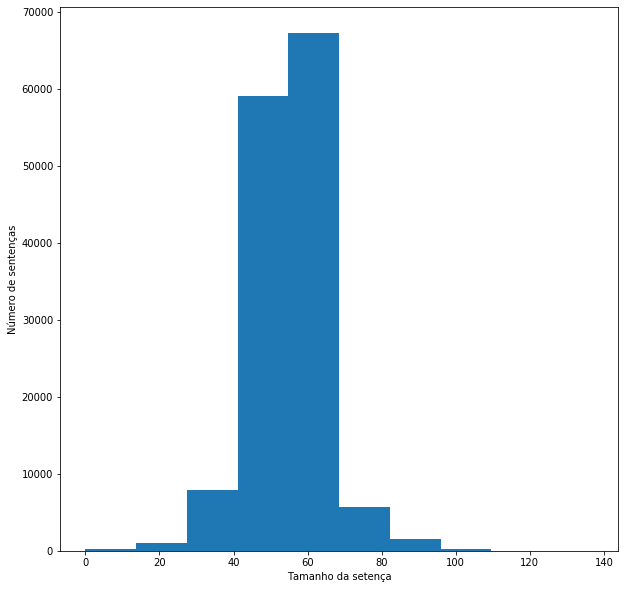

In [856]:
#Distribuilção das sentenças por quantidade de palavras
fig = plt.figure(figsize=(10, 10)) 
plt.xlabel('Tamanho da setença')
plt.ylabel('Número de sentenças')
plt.hist(sentence_lengths)
plt.show()

In [857]:
#contar frequencia de palavras
vectorizer = CountVectorizer(analyzer="word", tokenizer=tokenizer.tokenize)

In [858]:
# Construindo exemplos para treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(texto, classes, test_size=0.2,random_state=40)

In [859]:
#treinar com os dados selecionados
X_train_counts = vectorizer.fit_transform(texto)

In [860]:
# Visualizando o número de linhas e colunas da matriz:
X_train_counts.shape

(142839, 46096)

In [862]:
# Contabilizando os termos no vocabulário aprendido para treino
X_test_counts = vectorizer.fit_transform(classes)

In [863]:
# Visualizando o número de linhas e colunas da matriz:
X_test_counts.shape

(142839, 3)

In [867]:
def _tokenize_text(data):
    ls = []

    for line in data:
        tokens = wordpunct_tokenize(line)
        ls.append(tokens)

    return ls

In [907]:
X_train_tokens = _tokenize_text(X_train)
X_test_tokens = _tokenize_text(X_test)

In [869]:
def _apply_standardization(tokens, std_list):
    ls = []

    for tk_line in tokens:
        new_tokens = []
        
        for word in tk_line:
            if word.lower() in std_list:
                word = std_list[word.lower()]
                
            new_tokens.append(word) 
            
        ls.append(new_tokens)

    return ls

In [870]:
def _remove_stopwords(tokens, stopword_list):
    ls = []

    for tk_line in tokens:
        new_tokens = []
        
        for word in tk_line:
            if word.lower() not in stopword_list:
                new_tokens.append(word) 
            
        ls.append(new_tokens)
        
    return ls

In [871]:
stopword_list = []

In [873]:
nltk_stopwords = nltk.corpus.stopwords.words('portuguese')

In [874]:
# list of array
custom_stopwords = stopwords.values.tolist()

In [876]:
# transform list of array to list
custom_stopwords = [s[0] for s in custom_stopwords]

In [878]:
# You can also add stopwords manually instead of loading from the database. Generally, we add stopwords that belong to this context.
stopword_list.append('é')
stopword_list.append('vou')
stopword_list.append('que')
stopword_list.append('tão')
stopword_list.append('...')
stopword_list.append('«')
stopword_list.append('➔')
stopword_list.append('|')
stopword_list.append('»')
stopword_list.append('uai') # 'expression from the mineiros (MG/Brazil)'

In [880]:
# join all stopwords
stopword_list.extend(nltk_stopwords)
stopword_list.extend(custom_stopwords)

In [882]:
# remove duplicate stopwords (unique list)
stopword_list = list(set(stopword_list))

In [883]:
X_train_tokens = _remove_stopwords(X_train_tokens, stopword_list)

In [885]:
# check data
for i in range(0, 5):
    print(X_train_tokens[i])

['musas', 'carnaval', 'carioca', 'falam', 'sobre', 'ansiedade', 'antes', 'apuração']
['robert', 'pattinson', 'aparece', 'primeira', 'vez', 'traição']
['ex', 'nicole', 'bahls', 'dá', 'conferida', 'indiscreta', 'sunga']
['ufc', 'pede', 'pf', 'investigue', 'ameaças', 'professora', 'blog', 'feminista']
['grande', 'tubarão', 'branco', 'ronda', 'barco', 'ataca', 'isca', 'costa', 'flórida']


In [886]:
#criar gráfico de núvem
def _get_text_cloud(tokens):
    text = ''

    for tk_line in tokens:
        new_tokens = []
        
        for word in tk_line:
            text += word + ' '
        
    return text

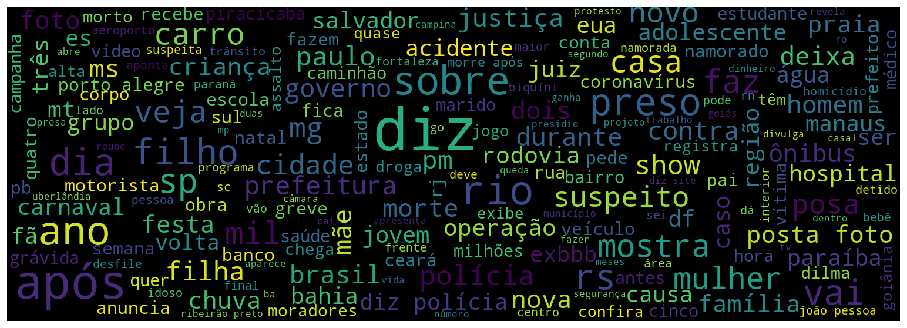

In [887]:
# print train WordCloud
sample_train = random.sample(X_train_tokens, 10000)
text_cloud = _get_text_cloud(sample_train)

word_cloud = WordCloud(max_font_size = 100, width = 1520, height = 535)
word_cloud.generate(text_cloud)
plt.figure(figsize = (16, 9))
plt.imshow(word_cloud)
plt.axis('off')
plt.show()

In [888]:
#frequencia de palavras 
def _get_freq_dist_list(tokens):
    ls = []

    for tk_line in tokens:
        for word in tk_line:
            ls.append(word)

    return ls

In [889]:
#distribuição de frequencia nos dados de treino coletados
fd_list = _get_freq_dist_list(X_train_tokens)
fdist = FreqDist(fd_list)
print(fdist)

<FreqDist with 42385 samples and 959771 outcomes>


In [890]:
# palavras mais comuns
most_common = fdist.most_common(50)
print(most_common)

[(',', 36126), ("'", 28284), ('diz', 9689), ('após', 6770), ('rio', 4628), ('polícia', 3708), ('sobre', 3594), ('sp', 2974), ('mostra', 2973), ('faz', 2951), ("',", 2809), ('anos', 2743), ('$', 2681), ('mil', 2503), ('homem', 2479), ('r', 2453), ('dia', 2452), ('morre', 2435), ('vai', 2398), ('contra', 2380), ('foto', 2357), ('rs', 2332), ('preso', 2220), ('veja', 2140), ('posa', 2081), ('%', 2059), ('acidente', 1968), ('suspeito', 1954), ('mulher', 1953), ('mg', 1889), ('durante', 1872), ('carro', 1866), ('ser', 1829), ('casa', 1779), ('governo', 1729), ('!', 1701), ('filho', 1647), ('deixa', 1593), ('dois', 1536), ('jovem', 1528), ('brasil', 1524), ('nesta', 1523), ('novo', 1497), ('show', 1399), ('vagas', 1391), ('grande', 1376), ('ônibus', 1372), ('morto', 1357), ('nova', 1352), ('pm', 1342)]


In [891]:
# palavras menos comuns
most_uncommon = fdist.hapaxes()
print(most_uncommon[0:30])

['pulverizada', 'retinha', 'sequíssimo', 'fabricados', 'liberty', 'mutilações', 'sisaleira', 'divinésia', 'soterrar', 'trapaceia', '11kg', 'manhumirim', 'palhano', 'ostermann', 'sarutaiá', 'sinara', 'rãs', 'contamina', 'julgo', 'docomo', 'apropriada', 'roseno', 'orindiúva', '5280', 'duplica', 'belarmino', 'oferecerá', 'testículo', 'golpeando', 'naïf']


In [892]:
# find the word occuring max number of times
fdist.max()

','

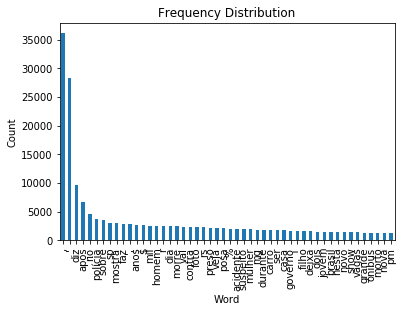

In [893]:
# print most common words
series = pd.Series(data=[v for k, v in most_common], index=[k for k, v in most_common], name='')
ax = series.plot(kind='bar', title='Frequency Distribution')
ax.set_xlabel('Word')
ax.set_ylabel('Count')
plt.show()

In [894]:
# number of times 
fdist.get('feminicídio')

23

In [899]:
# Freq = Number of occurences / total number of words
fdist.freq('feminicídio')

2.396404975770262e-05

In [900]:
# Freq = Number of occurences / total number of words
fdist.freq('feminismo')

5.209576034283178e-06

In [901]:
# Freq = Number of occurences / total number of words
fdist.freq('racismo')

4.167660827426542e-05

In [902]:
# Freq = Number of occurences / total number of words
fdist.freq('famoso')

2.292213455084598e-05

In [903]:
# Freq = Number of occurences / total number of words
fdist.freq('governo')

0.0018014713926551228

In [904]:
# Freq = Number of occurences / total number of words
fdist.freq('coronavírus') # 2453 / 984823

0.0010221188179263595

In [905]:
# Freq = Number of occurences / total number of words
fdist.freq('pandemia') # 2453 / 984823

5.938916679082823e-05

In [910]:
#preparação do dataset
#transformar tokens texto em uma lista de string)

In [911]:
def _untokenize_text(tokens):
    ls = []

    for tk_line in tokens:
        new_line = ''
        
        for word in tk_line:
            new_line += word + ' '
            
        ls.append(new_line)
        
    return ls

In [912]:
X_train = _untokenize_text(X_train_tokens)
X_test = _untokenize_text(X_test_tokens)

In [913]:
# check data
for i in range(0, 5):
    print(X_train[i])


musas carnaval carioca falam sobre ansiedade antes apuração 
robert pattinson aparece primeira vez traição 
ex nicole bahls dá conferida indiscreta sunga 
ufc pede pf investigue ameaças professora blog feminista 
grande tubarão branco ronda barco ataca isca costa flórida 


In [914]:
# create a count vectorizer object
vectorizer = CountVectorizer()
X_train_vect = vectorizer.fit_transform(X_train)

In [915]:
print(vectorizer.vocabulary_.get(u'pandemia'))

29339


In [916]:
#TF-IDF: Term Frequency - Inverse Document Frequency

In [917]:
tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_vect)

In [918]:
X_train_tfidf.shape

(114271, 42282)

In [920]:
#Prepare algorithm and run model

In [921]:
model = MultinomialNB()
model.fit(X_train_tfidf, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [922]:
standalone_predictions = model.predict(X_train_tfidf)

In [924]:
for doc, prediction in zip(texto, standalone_predictions):
    print('%r => %s' % (doc, prediction))

"gizelly desabafa 'sentindo indo embora sei próxima eu'" => não é economia
'ídolo sport, magrão relata tensão epicentro pandemia itália aflição grande' => não é economia
'‘era cara ativo, sempre fez esportes’, diz filha morador ivoti morreu covid19' => não é economia
'leila assume errada sobre rita diz vai ajudar lígia recuperar nina' => não é economia
"marcela comenta sobre brother 'se voltar, vai ficar insuportável'" => não é economia
"felipe sobre manu 'ontem extrema arrogância'" => não é economia
"manu chora sozinha revela 'estou medo'" => não é economia
'justiça concede prisão domiciliar joão deus causa pandemia coronavírus' => não é economia
'coronavírus morre eua médico orientou cirurgia separação gêmeas siamesas lis mel, df' => não é economia
'siga g1 rss' => não é economia
'coronavírus senado aprova projeto prevê r$ 600 mensais trabalhadores informais' => não é economia
'‘malhação viva diferença’ relembre história five' => não é economia
'siga cobertura sobre consequências esp

'presidente ccj diz votação previdência ficará semana vem falta acordo' => não é economia
"aprovar previdência, governo precisa participar articulação pode 'omitir', diz maia" => não é economia
'reforma previdência aprovada ccj câmara saiba próximas etapas tramitação' => não é economia
'ccj câmara dá início reunião votar reforma previdência' => não é economia
'comissão rejeita pedidos adiar deve votar reforma previdência nesta quintafeira' => não é economia
'relator pec previdência ccj anuncia alterações parecer após acordo centrão' => não é economia
'guedes diz intenção economizar r$ 1 trilhão dez anos reforma previdência' => não é economia
'aposentadoria idade poderá ser pedida telefone internet partir dia 21' => não é economia
'rombo previdenciário sobe r$ 290,2 bilhões 2018 bate recorde' => não é economia
"advogado informa endereço onde suposta candidata 'laranja' psl encomendado material campanha" => não é economia
'jair bolsonaro promessas candidato psl presidência' => não é econ

'pentágono indenizará vítimas ataque hospital kunduz' => não é economia
"'foi surreal', diz brasileira elogiada discurso michelle obama" => não é economia
'análise kerry pronto ser secretário estado 4 anos' => não é economia
"documentos mostram estado islâmico gerencia 'despojos guerra'" => não é economia
"munique declara 'transbordada' chegada milhares refugiados" => não é economia
'exército sírio faz ofensiva contra reduto rebelde apoio rússia' => não é economia
'exilados iranianos dizem general gravemente ferido síria' => não é economia
'nicolas sarkozy anuncia volta política francesa' => não é economia
'estado islâmico toma exército duas localidades centro síria' => não é economia
'bono, funcionários grafiteiro veja lucra ipo facebook' => não é economia
'entenda ipo facebook, pode mudar ganha' => não é economia
'facebook começa negociar ações bolsa nova york' => não é economia
'conselho segurança arábia, chade, nigéria, chile lituânia' => não é economia
'cinco novos países juntarão

'mp reitera recomendação afastar vereadores suspeitos comissão' => não é economia
'sindicato pede justiça ms prisão prefeito secretário finanças' => não é economia
'justiça nega prisão prefeito capital ms secretário finanças' => não é economia
'aneel dá aval empréstimo r$ 718 milhões furnas eletronorte' => não é economia
'início operação belo monte adiado segunda vez' => não é economia
'aneel vê problema transmissão belo monte 2016' => não é economia
'governo pode arrecadar r$ 17 bi leilões hidrelétricas antigas' => não é economia
'procura investidores leilão usinas grande, diz ministro' => não é economia
'dólar volta passar r$ 3,90 turbulências políticas' => não é economia
'dólar fecha alta após passar r$ 3,92 turbulências políticas' => não é economia
'economia recua 1,7% 3º trimestre, país segue recessão' => não é economia
'promotoria impugna seis 11 candidatos prefeito paulo' => não é economia
'atividade industrial eua contrai gastos construção sobem' => não é economia
'edson moraes

"'london calling' clash tema coluna nelson motta" => não é economia
'fotógrafo cria projeto revitalização rio doce tragédia' => não é economia
'cessão onerosa tudo precisa saber' => não é economia
'aumenta número áreas naturais adquiridas compensação reserva legal' => não é economia
'patti smith tema coluna nelson motta' => não é economia
'sebastião salgado sugere criação fundo recuperação rio doce' => não é economia
'homem enfia cabeça embaixo vestido atriz festival cannes' => não é economia
"argentino 'relatos salvajes' arranca risos aplausos cannes" => não é economia
'grace jones tema coluna nelson motta' => não é economia
'tradicional cinema paulo, gemini fecha portas após 35 anos' => não é economia
"elenco 'vingadores ultron' vai préestreia hollywood" => não é economia
'lucro netflix cresce 2º trimestre, ações recuam' => não é economia
'cante samba império casa verde' => não é economia
'conheça setores sambódromo anhembi' => não é economia
'cante samba acadêmicos tucuruvi' => não 

'prazo pagar guia esocial dezembro termina nesta quinta' => não é economia
'forte alta, bovespa reverte perdas véspera' => não é economia
'petrobras afirma decisão sobre aumento preço gasolina' => não é economia
"aumento gasolina 'não anuncia, pratica', diz graça foster" => não é economia
'mantega nega haverá aumento 10% gasolina nesta semana' => não é economia
'economia parada recessão, diz guido mantega' => não é economia
'inflação oficial fica 0,01% julho, diz ibge' => não é economia
'mantega prevê crescimento médio 5,9% 2011 2014' => não é economia
'bovespa recua aversão global risco preocupação fiscal' => não é economia
'bolsas europa fecham queda, dados fracos china' => não é economia
'bolsas eua têm maior ganho diário quatro anos' => não é economia
'bolsa china volta fechar queda' => não é economia
'quatro ameaças crescimento constante economia chinesa' => não é economia
'entenda acontecendo china reflexos mercados' => não é economia
'abate suínos recorde 3º trimestre 2015, apon

'colisão frontal moto carro mata duas mulheres vale sinos' => não é economia
'argentinos morrem acidente br290, uruguaiana rs' => não é economia
'mulher roubada, esfaqueada estuprada dentro casa rs' => não é economia
'jovem morre após sofrer descarga elétrica cair rio uruguai, rs' => não é economia
'comerciante morre atingido bala perdida zona leste porto alegre' => não é economia
'começa campanha vacinação contra gripe rs' => não é economia
'rio uruguai volta subir preocupa moradores fronteira oeste rs' => não é economia
'vereador joão carlos maciel mandato cassado santa maria, rs' => não é economia
'rs noite menos três mortes trânsito, dizem polícias' => não é economia
'rs pontos doação municípios atingidos chuva' => não é economia
'após 19 horas, bombeiros controlam incêndio depósito pneus rs' => não é economia
'19,6 mil pessoas casa após chuva rs, diz defesa civil' => não é economia
'mp denuncia 10 envolvimento fraude queijo rs' => não é economia
'presos operação contra queijo adul

'blairo maggi diz brasil pode retaliar chile suspender importações carne' => não é economia
"ministério agricultura diz 'não existe risco' sanitário país" => não é economia
'uepg divulga gabaritos provas vestibular verão confira' => não é economia
"temer diz 'viu exageros' pf operação carne fraca" => não é economia
'temer vai churrascaria brasília ministros embaixadores' => não é economia
'adolescente morre ser atropelado pr151, piraí sul castro' => economia
'inscrições vestibular inverno uepg terminam quintafeira' => não é economia
'inscrições vestibular verão' => não é economia
'uepg divulga aprovados pss' => não é economia
'chuva provoca alagamentos danifica casas norte paraná' => não é economia
'quase 50 mil pessoas atingidas chuva paraná' => não é economia
'bovespa passa subir, após cair pressionada empresas setor carnes' => não é economia
'china vai reter portos carne brasil receber esclarecimentos, diz maggi' => não é economia
'suspeito matar professor desapareceu ponta grossa p

'secretaria apura paciente coronavírus palestrou 100 pessoas jiparaná, ro' => não é economia
'#fake mensagem vídeo diz álcool gel funciona forma prevenção contra coronavírus' => não é economia
'coronavírus sejus suspende visitas íntimas 30 dias presídios rondônia' => não é economia
'adolescentes região bauru destacam olimpíadas física' => não é economia
'coronavírus governo rondônia decreta situação emergência saúde pública' => não é economia
'veja tirar certificado proficiência inglês' => não é economia
'sobe 61 número casos suspeitos novo coronavírus rondônia, diz ministério' => não é economia
'hospitais rondônia mudam regras visitação causa coronavírus veja horários' => não é economia
'fvsam monitora zika vírus após surto microcefalia nordeste' => não é economia
'polícia apreende caminhão madeira ilegal rodovia am' => não é economia
'tre/am inicia vistoria lacre urnas' => não é economia
'detran inicia ação regularizar motoristas 26 cidades am' => não é economia
'alunos ita põem órbi

'homem assassinado três disparos cabeça campina grande' => não é economia
'pernambuco contabiliza quase mil pessoas assassinadas dois primeiros meses 2017' => não é economia
'governador pe sanciona reajuste salarial policiais bombeiros militares' => não é economia
'adolescente condenado cumprir medida socioeducativa morte padre pb' => não é economia
'padre fez sexo excoroinha antes ser morto pb, diz polícia' => não é economia
'suspeitos estupro vulnerável presos durante operação cronos ii piauí' => não é economia
'jovem morre após ingerir bebida encontrada lado corpo pai cocal, norte piauí' => não é economia
'padre morto 29 facadas polícia descarta latrocínio borborema, pb, diz polícia' => não é economia
'idoso morre cerca 80% corpo queimado cocal, piauí' => não é economia
'surdo escolhido ser orador turma primeira vez universidade federal piauí' => não é economia
'instituto federal (ifpi abre vagas cursos técnicos 16 cidades piauí' => não é economia
'ibge piauí abre concurso vagas ter

'operação combate pornografia infantil prende 251 pessoas país' => não é economia
'rodovia régis bittencourt trecho duplicado entregue nesta terçafeira' => não é economia
'polícia prende dupla suspeita tráfico drogas miracatu, sp' => não é economia
'irmãos detidos transportando lançaperfume rj porto alegre' => não é economia
'régis bittencourt duplicada após ficar sete anos obras' => não é economia
'espécie borboleta encontrada sp após 50 anos buscas' => não é economia
'turistas sp trocaram ônibus antes acidente matou motorista régis, diz parente vítima' => não é economia
"padre diz passageiros dormiam momento colisão ônibus carreta régis 'acordei debaixo banco'" => não é economia
'colisão dois caminhões deixa morto rodovia régis bittencourt' => não é economia
'mulher condenada df chamar pm negro ‘macaco’' => não é economia
'mulher bate carro mercado df funcionário atingido estilhaços' => não é economia
"propagação 'explosiva' pode levar zika 4 milhões casos, diz oms" => não é economia

'veja agenda deste sábado candidatos governo pará' => não é economia
'senador jader barbalho vira réu ação penal supremo' => não é economia
'eleição governador pará decidida segundo turno' => não é economia
'veja oito deputados federais eleitos distrito federal' => não é economia
'ibope, votos válidos helder 52% jatene, 48% pa' => não é economia
'pat abre 20 vagas emprego vigilante experiência sumaré' => não é economia
'corpo bombeiros paulo abre concurso 144 vagas' => não é economia
'crise chega natal papai noel fica emprego fim ano' => não é economia
'‘não problema alexandre’, diz lira maia após eleições' => não é economia
'nelson barbosa volta defender manutenção vetos congresso' => não é economia
'pesquisa ibope registra empate helder jatene 40% pará' => não é economia
'justiça federal to condena jader barbalho ressarcir união' => não é economia
'entenda condenação jader barbalho desvio sudam' => não é economia
'veja agenda candidatos governo pará nesta quarta' => não é economia
's

'policial militar morre atingido raio enquanto pescava, goiás' => não é economia
'jovem relata agressões policiais durante festival go pm nega' => não é economia
'prf registra três mortes últimas 24h rodovias cortam goiás' => não é economia
'policial militar preso suspeito vender armas uso restrito, go' => não é economia
'cabo pm baleado durante trabalho petrolina goiás' => não é economia
'paciente destrói computadores hospital após surto go veja vídeo' => não é economia
'pedreiro voluntário 30 anos escola ajudou construir, go' => não é economia
'homem achou bebê sacola diz menino quase ar' => não é economia
'após ataques, 50 celulares apreendidos cadeia jataí' => não é economia
'ação prende 13 suspeitos roubar carros fraudar documentos, go' => não é economia
'suspeito fazer empréstimos nome terceiros preso goiás' => não é economia
'presos oito suspeitos sequestros gerentes bancos goiás' => não é economia
'vítima assalto arrasta moto acorrentada pescoço pede ajuda' => não é economia
'm

'florianópolis atinge 34,1°c novo recorde calor deve continuar sc' => não é economia
'enchente tornado, fenômenos extremos devem intensificar sc' => não é economia
'florianópolis festas privadas luxo virada ano programese' => não é economia
'elevado canasvieiras inaugurado florianópolis' => não é economia
'dois pescadores resgatados após 24h deriva mar' => não é economia
'ingresso conhecer orquestra buena vista social club custa r$ 300' => não é economia
'oeste sc, prf apreende 10 mil maços cigarro contrabandeado' => não é economia
"'tranquilo', diz aluno rs aprovado 11 vestibulares medicina" => não é economia
'réus devolver dinheiro farra diárias martinho, rs' => não é economia
'pai preso suspeito esfaquear filha 3 anos martinho, rs' => não é economia
'vacina contra gripe liberada toda população partir segunda, diz divesc' => não é economia
'florianópolis quase 493 mil habitantes, segundo estimativa ibge' => não é economia
'decisão sobre mudança gestão hu florianópolis adiada' => não 

'vacina contra hpv pode prevenir câncer colo útero mulher' => não é economia
'rio preto, sp, começa mega mutirão 500 agentes contra dengue' => não é economia
'agenda cultural veja atrações fim semana região rio preto' => não é economia
'olímpia, sp, entra lista cidades epidemia dengue' => não é economia
'ministério nega relação apagão alta consumo energia' => não é economia
'autoridades araçatuba discutem resolver problema creches' => não é economia
'conheça quatro classificados rio preto final sabor sp' => não é economia
'apagão origem curtocircuito linha transmissão, diz ons' => não é economia
'dia desafio atividades represa municipal rio preto, sp' => não é economia
'confira atrações região rio preto, sp, fim semana' => não é economia
'araçatuba alerta índice dengue neste início ano' => não é economia
'mp apura denúncia fraude sobre exames dengue rio preto' => não é economia
'moradores birigui jogarem lixo ruas poderão ser multados' => não é economia
'mp abre inquérito investigar po

'empresário preso araçatuba suspeito torturar enteada 2 anos' => não é economia
'maltratada padrasto lesões causadas cola, aponta laudo' => não é economia
'casal preso após forjar sequestro causa carro empresa' => não é economia
'vídeo mostra empresário maltratando enteada 2 anos araçatuba veja' => não é economia
'‘de jeito nenhum’, responde padrasto sobre maltratar enteada 2 anos' => não é economia
"preso maustratos deu cebola enteada 2 anos 'morde, maçã'" => não é economia
'nº atropelamentos cresce duas rodovias noroeste paulista' => não é economia
'motociclistas fazem manifestação contra uso cerol birigui' => não é economia
'radares br153 ligados começam operar região rp' => não é economia
'radares br153 rio preto começam funcionar nesta 6ª feira' => não é economia
'passagem ônibus deve subir r$ 4,69 nova empresa ônibus bragança paulista' => não é economia
'últimas notícias sobre coronavírus 4 março' => não é economia
'brasil 3 casos confirmados 531 casos suspeitos novo coronavírus'

'cidades região ficam energia durante quase hora nesta 2ª feira' => não é economia
'inscrições concurso redação tv vão dia 26' => não é economia
'stf julga nesta quarta recurso contra mudança rito impeachment' => não é economia
'relator vota manter decisão stf alterou rito impeachment' => não é economia
'maioria stf rejeita recurso câmara sobre rito impeachment' => não é economia
'deputado pmdb diz sondado assumir aviação civil' => não é economia
'pf prende suspeitos fraude contra sistema financeiro nacional' => não é economia
'promotores pediram prisão lula recorrem decisão juíza' => não é economia
'luiz inácio lula silva nomeado ministrochefe casa civil' => não é economia
'notícias terminar 4 março beminformado' => não é economia
'pf estima quadrilha enviava menos us$ 10 mi mês exterior' => não é economia
"'dilma queria lula assinasse termo resto ilação', diz rui falcão" => não é economia
'partidos deixam base aliada após divulgação grampo telefônico' => não é economia
'protestos val

'senador acir gurgacz recebe visitas 1° dia prisão brasília' => não é economia
'confira locais fiscalização radares móveis jacareí, sp' => não é economia
'senador acir gurgacz deixa sede pf foz iguaçu ser levado brasília' => não é economia
'preso, acir gurgacz pede supremo trabalhar senador durante dia' => não é economia
'senador acir gurgacz chega brasília cumprir pena papuda' => não é economia
'senador acir gurgacz vai cumprir pena cela individual papuda' => não é economia
'arcoíris duplo chama atenção moradores região veja fotos' => não é economia
'prefeitura jacareí interdita rua centro facilitar compras natal' => não é economia
'bancos públicos devem emprestar r$ 2,5 bilhões distribuidoras' => não é economia
'serasa prorroga feirão online limpar nome boa vista faz mutirão' => não é economia
'veja agenda candidatos governo minas nesta quintafeira, 2' => não é economia
'ministros vão jantar casa temer explicar medidas pmdb' => não é economia
'nada problemático economia brasileira, d

'tce determina bloqueio contas 17 prefeituras interior piauí' => não é economia
'tcepi bloqueia contas 15 cidades atraso prestação contas' => não é economia
"'ainda recuperei', diz filha vítima 'crime motosserra'" => não é economia
'esquartejamento, ácido tortura crime motosserra ac faz 23 anos viúva fala 1ª vez' => não é economia
'após suspensão julgamento, hildebrando pascoal ouvido ac crime 20 anos' => não é economia
'ifpi encerra prazo inscrição supervisores pronatec' => não é economia
'após pedir volta excoronel ‘crime motosserra’ presídio, mpac pede prisão domiciliar' => não é economia
'agência bancária explodida bahia fica totalmente destruída' => não é economia
'carro bate, capota atropela quatro pessoas bairro bonfim' => não é economia
'vítima atropelamento bonfim, salvador, perna amputada' => não é economia
'jovem sai carro após batida ba morre atropelado outro veículo' => economia
'dois ciganos mortos polícia investiga causa briga familiar' => não é economia
'acusado matar c

'pai foragido, família mulher morta tenta guarda filho mg' => não é economia
'marido matou queimou consultora beleza, diz advogado' => não é economia
'mineiro encontra arte caminho realização pessoal' => não é economia
'pf combate comércio ilegal pedras preciosas cumpre mandados mg' => não é economia
'livros arrecadados estudantes doados biblioteca divinópolis' => não é economia
'livros arrecadados flid doados biblioteca divinópolis' => não é economia
'distribuição remédios formiga volta ser feita farmácia municipal' => não é economia
'acidente carro deixa quatro jovens feridos oliveira' => não é economia
'polícia localiza cofre igreja terreno abandonado oliveira' => não é economia
'condenado pedofilia, expadre carmo mata preso bh' => não é economia
'idoso cnh vencida fica ferido após acidente oliveira' => não é economia
"'oncinha' encontrada dentro escola cláudio, mg" => não é economia
'polícia divulga balanço piracema alto paranaíba triângulo mineiro' => não é economia
'abertas inscr

'lei determina mudança unidades saúde joão del rei, mg' => não é economia
'anastasia anuncia liberação recursos obras zona mata' => não é economia
"'minas território arte' bh expõe artistas zona mata" => não é economia
'quadro vagas programa médicos juiz todo preenchido' => não é economia
'rede saúde atenderá 1,5 milhão pacientes zona mata' => não é economia
'edital médicos vagas cidades zona mata campo vertentes' => não é economia
'cúria metropolitana juiz recebe exposição vitrais religiosos' => não é economia
'publicado resultado final licitação táxis juiz' => não é economia
"espetáculo 'o quebra nozes' apresentado juiz" => não é economia
'cúpula catedral metropolitana juiz ganha novas pinturas' => não é economia
'parceria contribui revitalização pintura catedral juiz' => não é economia
'idoso morre atropelado moto carreta br040 santos dumont' => não é economia
'obra samu regional juiz deve ser concluída neste mês' => não é economia
'juiz discute implantação rede urgência emergência'

'foragido achado após envolver acidente trânsito santarém' => não é economia
'produtores ms plantam milho safrinha apesar custo semente' => não é economia
'estradas ruins deixam frete caro escoar produção soja go' => não é economia
'queimadas consomem hectares am geram prejuízo agricultores' => não é economia
'projeto rn reaproveita água esgoto produção agrícola' => não é economia
'jovem preso suspeito estuprar adolescente 15 anos oriximiná' => não é economia
'gto santarém ajuda buscas assaltantes basa rurópolis' => não é economia
'focos queimada amazônia superam média histórica agosto, diz inpe' => não é economia
'fórum debate desenvolvimento' => não é economia
'motociclista atropelado taxista bêbado internado uti hms' => não é economia
'dois homens morrem acidente motos alenquer, pa' => não é economia
'morre 69 anos presidente cdl santarém, joão sena' => não é economia
'dupla leva joias relógios loja bairro aparecida, santarém' => não é economia
'aneel autoriza alta média 34,9% conta

"haddad afirma ação denarc cracolândia 'lamentável'" => não é economia
'nova base aliada governador reeleito am maioria aleam' => não é economia
'manaus, josé melo empossado novo governador amazonas' => não é economia
'sete governadores renunciam mandatos razão eleições' => não é economia
'ap vai falhar brasil, diz ministra sobre combate aftosa' => não é economia
'preço botijão gás amapá segundo alto país, diz anp' => não é economia
'fotos mostram inchaços pacientes chikungunya, ap' => não é economia
"ap, cientista político diz brasil 'está preso cultura corrupção'" => não é economia
'eleitores escolhem 10 novos conselheiros tutelares macapá' => não é economia
'votos computados 10 dias após eleição conselho tutelar ap' => não é economia
'ap, laudo afirma abertura comportas provocou morte peixes' => não é economia
'faixa frente conselho tutelar protesta contra falta estrutura' => não é economia
'lojistas estendem horário atrair consumidores macapá' => não é economia
'ap, comércio espera

'falha intervenção local, diz secretário sobre ataque pedrinhas' => não é economia
'litoral fortaleza elevação maré ondas três metros' => não é economia
'polícia registra 33 acidentes estradas ceará fim semana' => não é economia
'encanta ceará reúne multidão fortaleza 5 horas festa' => não é economia
'terminal messejana vai funcionar espaço provisório durante reforma' => não é economia
'icc promove campanha arrecadar fraldas geriátricas' => não é economia
'trailer batalhão polícia militar incendiado litoral norte alagoano' => não é economia
'taxistas impedem circulação veículos alternativos alagoas' => não é economia
'fim semana exposições, festivais música dança mt' => não é economia
'seis municípios alagoas epidemia dengue, diz sesau' => não é economia
'segundo acidente buggy ocorre ceará menos 24 horas' => não é economia
'festival cururu siriri opções lazer cuiabá' => não é economia
"prf inicia 'operação aparecida' 320 policiais estradas ceará" => não é economia
'ressaca mar alaga t

'servidores miguel campos cobram salários atrasados' => não é economia
'delegada confirma prisão policial sumiço grávida penedo' => não é economia
'exdelegado cidade penedo, al, afastado polícia 90 dias' => não é economia
"casa trabalhador santa bárbara d'oeste 220 vagas emprego" => não é economia
'delegacia matriz passará inspeção judicial próxima semana' => não é economia
'justiça alagoas prorroga prisão exprefeito traipu 30 dias' => não é economia
'mpal vai apurar falhas prestação contas sus três municípios' => não é economia
'98% beneficiários alagoas cumprem exigências bolsa família' => não é economia
'edital concurso produção audiovisual alagoas anulado' => não é economia
'parte antigo prédio secretaria educação alagoas desaba' => não é economia
'operação polícia contra tráfico droga detém três suspeitos rafard' => não é economia
'empresário piracicaba fica 3 dias desaparecido após ter carro roubado' => não é economia
'desempregado preso após assaltar casa levar carro piracicaba,

'região centrooeste paulista prepara corpus christi' => não é economia
'ônibus atropela vaca rodovia marechal rondon manuel' => não é economia
"caminhãotanque 'recheado' maconha 3 toneladas droga" => não é economia
'dupla presa após ser flagrada cocaína maconha bauru' => não é economia
"cão dá 'show sincronia' repetir movimentos ioga lado dono" => não é economia
'cão flagrado passeando garupa bicicleta china' => não é economia
"cão glamouroso vento leva encarada 'invejosa' alemanha" => não é economia
'gaivota provoca engavetamento estrada movimentada turquia' => não é economia
'gaivota rouba sorvete momento jovem fotografava guloseima' => não é economia
'gaivota invade cinema assusta funcionário escócia' => não é economia
'gaivota rouba câmera faz filmagem panorâmica ilha espanha' => não é economia
'forças prógoverno apoderam capital provincial iêmen' => não é economia
'combates soldados rebeldes deixam 60 mortos iêmen' => não é economia
'suíça busca herdeiros r$ 180 milhões ‘esquecido

'vídeo mostra búfalos salvando companheiro atacado leoas' => não é economia
'hienas expulsam 3 leoas disputar carcaça parque sulafricano' => não é economia
'motorista morre ms após carreta carregada mandioca bater barranco' => não é economia
'confusão bar termina homem morto facada pescoço ms, diz polícia' => não é economia
'leão fica amedrontado ser perseguido manada búfalos' => não é economia
'polícia flagra estocagem irregular combustíveis borracharia ms' => não é economia
'leão foge desesperado ser perseguido manada búfalos' => não é economia
'lista traz hipopótamo dando carona tartarugas cenas curiosas' => não é economia
'caminhãotanque tomba provoca congestionamento br262 ms' => não é economia
'chuva ventania derrubam árvores campo grande' => não é economia
'cai intenção compras natal franca 68% pagarão vista, diz acif' => não é economia
'motorista morre após bater carreta três ficam feridos via franca' => não é economia
'funcionário fazenda preso caça ilegal ms animais abatidos 

'prefeitura libera área descarte entulho caçambas ribeirão' => não é economia
'aconteceu venezuela últimos dias, último ano últimos 20 anos' => não é economia
"'irresponsabilidade', diz idoso caiu obra sinalização ribeirão" => não é economia
'venezuela liberta violinista tornou símbolo protestos' => não é economia
'daesp cita divergência aviação civil ampliação leite lopes' => não é economia
'número pedidos refúgio venezuelanos 2017 dobro 2016 roraima' => não é economia
'presidente conselho ética diz vai stf devido caso cunha' => não é economia
'veja regras projeto amplia 20 dias licençapaternidade' => não é economia
'aeroporto simula acidente avião ribeirão preto, sp' => não é economia
'aviação civil aprova projetos ampliação leite lopes ribeirão' => não é economia
'dívidas transerp maiores patrimônio empresa, aponta tce' => economia
'economistas pioram projeção desempenho pib primeiro trimestre' => não é economia
'fmi vê melhora economia brasileira, cobra reforma previdência sugere a

'resultado parcial revela 95% crimeios querem unir rússia' => não é economia
'demonstração apoio, ue fortalece lacos ucrânia' => não é economia
'maioria russos apoia anexar novas áreas ucrânia, diz pesquisa' => não é economia
'eua, ucrânia, rússia ue reunirão evitar crise controle' => não é economia
'parlamento crimeia pede oficialmente anexação rússia' => não é economia
'parlamento russo deve aprovar lei adesão crimeia' => não é economia
'entenda implicações acordo ue ucrânia, geórgia moldávia' => não é economia
'confrontos leste ucrânia deixam 12 mortos 24 horas' => não é economia
'separatistas cancelam novas negociações paz ucrânia' => não é economia
'sob pressão, banco central rússia reduz juros' => não é economia
'conflitos deixam 15 soldados mortos região separatista ucrânia' => não é economia
'combates leste ucrânia deixam 10 mortos 24 horas' => não é economia
'mortes abalam trégua ucrânia presidente diz temer ameaça russa' => não é economia
'exército ucraniano lança ofensiva co

'reserva ambiental ajuda formação consciência ecológica alunos' => não é economia
'iml registra sete corpos vítimas homicídios dois acidentes' => não é economia
'pioneiros roça cangaceiros boa classificam japaratuba' => não é economia
'8ª edição concurso levanta poeira aberta salgado,' => não é economia
'acidente deixa três mortos ferido br101 sergipe' => não é economia
'pássaros silvestres apreendidos capital paraense' => não é economia
'amigos mortos dentro casa após homens invadirem residência' => não é economia
'corpo jornalista silvinha oliveira sepultado aracaju' => não é economia
'motorista microônibus assassinado durante trabalho' => não é economia
'ssp descarta tentativa roubo caso morte motorista ônibus' => não é economia
'confira horários missas realizadas cemitérios aracaju' => não é economia
'mãe filha morrem atropeladas zona oeste sp' => não é economia
'tráfego trecho ponte caiu lento flui meia pista' => não é economia
'petrobras estuda possível abertura capital br distri

'homem morto 20 tiros calçada casa oeste potiguar' => não é economia
'rn 154 casos microcefalia ano suspeita relação zika' => não é economia
'cliente mata assaltante posto combustíveis grande natal, diz pm' => não é economia
'jacaré 2 metros capturado zona norte natal' => não é economia
'rn abre processo contratação agentes penitenciários temporários' => não é economia
'jacaré aparece meio asfalto cidade enfrenta seca rn' => não é economia
"após seis anos, barragem apanha peixe volta 'sangrar' oeste potiguar veja vídeo" => não é economia
'pm registra homicídio rn 14 desde sábado carnaval' => não é economia
'polícia ambiental captura jacaré açude gargalheiras, interior rn' => não é economia
'homicídios crescem 18% natal 14% região metropolitana, diz pm' => não é economia
'suspeito iniciar incêndio três vítimas rs denunciado mp' => não é economia
"secretário culpa 'causas sociais' aumento homicídios rn" => não é economia
'rn termina 2012 6º estado menos conclui crimes assassinato' => não

'criança toca fogo colchão mãe salva filhos incêndio paraíba' => não é economia
'incêndio destrói sala creche centro joão pessoa' => não é economia
'dupla rádios comunicadores frequência pm presa paraíba' => não é economia
'ônibus quadrilha junina roubado após exibição campina grande' => não é economia
'homem assaltado vítimas acidente agreste pb, diz polícia' => não é economia
'chef jpb apresenta receita cuscuz carne sol creme queijo' => não é economia
'chef jpb ensina fazer lasanha quatro queijos molho branco' => não é economia
'veja receita consomê batata creme cebola chef jpb' => não é economia
'chef jpb ensina gratinado carne sol banana queijo coalho' => não é economia
'entidade diz ter sido malinterpretada ver ligação microcefalia larvicida' => não é economia
"carnaval 'coquetel explosivo' espalhar zika, alertam infectologistas" => não é economia
'pernambuco confirma 12 casos microcefalia ligados zika vírus' => não é economia
"dilma promete 'extremo empenho' brasil combate aedes 

'justiça suspende diplomação prefeito eleito vice mg' => não é economia
'polícia ouve suspeitos participar assassinato professora mg' => não é economia
'corpo bombeiros forma turma salvavidas atuar araxá' => não é economia
'corpo localizado margens rio claro nova ponte, mg' => não é economia
'jovem tenta assaltar caminhoneiro morto tiros lagoa grande' => não é economia
'criança morre após afogar piscina prédio patos minas' => não é economia
'bebida alcoólica maior causadora acidentes aquáticos triângulo' => não é economia
'servidores vicente bloqueiam avenida praia durante protesto' => não é economia
'presos tentam fugir penitenciária vicente, litoral sp' => não é economia
'médicos uberaba voltam ruas melhorias saúde pública' => não é economia
'prefeitura uberaba abre inscrições contratar médicos' => não é economia
'suspeito espancar ex ficar longe vítima após ameaças' => não é economia
'criança fica ferida mexer explosivos uberlândia' => não é economia
'dois atingidos durante baile fu

'dois homens presos após tiroteio perto parque porto alegre' => não é economia
'projeto busca cura esclerose lateral amiotrófica faz coletas rs' => não é economia
'parques tecnológicos rs fecham parceria internacionalização' => economia
'pai filho assassinados festa natal centro espírita rs' => não é economia
'especialistas estrangeiros debatem sobre segurança porto alegre' => não é economia
'motorista ônibus escolar morre eletrocutado rs, dizem bombeiros' => não é economia
'unidade sebrae móvel estará tietê atender empreendedores' => não é economia
'cadeirinha pode ter salvado bebê acidente matou mãe feriu pai' => não é economia
'bebê pai sobreviveram acidente recebem alta hospital' => não é economia
'moradores denunciam cortes árvores cidade dilermando aguiar' => não é economia
'quinto suspeito assalto banco dilermando aguiar preso rs' => não é economia
'manifestantes fazem caminhada castello branco reforma agrária' => não é economia
'moradores bairro onde jovem morto acusam pms exto

'acidente duas carretas deixa morto outro ferido br135' => não é economia
'audiência pública discute retomada obras barragem berizal' => não é economia
'polícia discorda informações dadas motorista depoimento' => não é economia
'ultraleve cai josé buriti mata duas pessoas' => não é economia
'chuvas ajudam elevar nível reservatórios usinas hidrelétricas' => não é economia
'homem preso suspeito estuprar menina 12 anos' => não é economia
'começam matrículas convocados 2ª chamada sisu' => não é economia
"eduardo azeredo condenado 20 anos prisão 'mensalão tucano'" => não é economia
'carro roubado nova apreendido ipatinga' => não é economia
'homens armados assaltam ônibus 30 passageiros minas' => não é economia
'polícia federal cumpre mandados prédio fiemg, belo horizonte' => não é economia
'operação esopo investiga fraudes realiza prisões minas' => não é economia
'três morrem três ficam feridos acidente br040, minas gerais' => não é economia
'produtores cristália abandonam campo causa seca'

'inflação campo grande fecha fevereiro 0,87%, aponta ipc' => não é economia
'terrenos limpos após notificação defensoria alerta multa ms' => não é economia
'agenda cultural teatro, festival rock feira internacional mt' => não é economia
'bando invade casa, tranca moradores quarto rouba veículos objetos' => não é economia
'homem condenado guardar 4 kg cocaína casa preso ms' => não é economia
'chuvas causam enxurradas dois jovens salvos polícia ms' => não é economia
'família paraguaia presa suspeita tráfico drogas município ms' => não é economia
'flores multicoloridas, exposição baiano ms fica aberta dia 24' => não é economia
'sindicato professores ufms anuncia paralisação sextafeira' => não é economia
'duas mulheres presas obrigar jovem prostituir ms' => não é economia
'instituições ensino ms oferecem 8,4 mil vagas sisu' => não é economia
'ms 8,4 mil vagas sisu 2015 inscrições começam nesta segunda' => não é economia
'três dias prazo final, número inscritos enem chega 4,4 milhões' => nã

'entidade vai premiar maiores produtores leite campo grande' => não é economia
'marquinhos rose disputam 2º turno campo grande bernal fica 3º' => não é economia
'suspeitos batem camionete roubada durante fuga prf capital ms' => não é economia
'ladrões invadem igreja, amarram homens roubam caminhonete' => não é economia
'rapaz brutalmente espancado durante briga campo grande' => não é economia
'motociclista fica ferido colisão carro campo grande' => não é economia
'justiça nega liberdade envolvido atentado policial aposentado' => não é economia
'motociclista morre atropelado bitrem br163 dourados, ms' => não é economia
'rotatividade pessoal comércio campo grande chega 4,16%' => não é economia
'jovens atingidos tiros bairro dourados, ms' => não é economia
'major pm morre após ser baleado esposa durante briga ms' => não é economia
'adolescentes apreendidos pichar escola campo grande' => não é economia
'câmara campo grande derruba veto suspende cobrança cosip' => não é economia
'adolescent

'governo federal reconhece situação emergência decretada paraná' => não é economia
'greve professores continua ponta grossa cidades região' => não é economia
"itaú 'encolhe', mantém liderança marcas valiosas país" => não é economia
'pesquisa aponta paraná delegado cada 30 mil habitantes' => não é economia
'ladrão chinês condenado após engolir diamante falso sri lanka' => não é economia
'itaú, bradesco skol marcas valiosas 2014 brasil' => não é economia
'adolescente engole apito cães objeto vai parar pulmão' => não é economia
'agepen investiga uso celulares presídios campo grande' => não é economia
"preso fingia ser padre médico diz golpe 'ideia criativa'" => não é economia
'exposição homenageia artista plástico cuiabano joão sebastião' => não é economia
'preso ms continua passar médico aplicar golpes, diz polícia' => não é economia
'exposição museu arte mt traz obras premiadas estado' => não é economia
'justiça decreta prisão temporária suspeito matar universitária mt' => não é economi

'candidatos prefeito cuiabá prestam contas prazo, diz tremt' => não é economia
'ufmt abre inscrições concurso público 42 vagas professor' => não é economia
'corpo estudante desaparecida encontrado cidade mt' => não é economia
'jovem preso suspeito estuprar 3 garotas mt matar vítima' => não é economia
'sinop concentra 27% casos dengue registrados mt' => não é economia
'inscrição 505 vagas cursos técnicos ifmt termina segunda' => não é economia
'decisão liminar libera r$ 50 mil combate fogo parque mt' => não é economia
'operação flagra transporte noturno madeira ilegal mato grosso' => não é economia
'ibama flagra garimpo ilegal área preservação município mt' => não é economia
'site vende ilegalmente caros ingressos jogos copa df' => não é economia
'governo sorteia 1344 ingressos copa 27 escolas públicas df' => não é economia
'henry autorizado cumprir restante pena casa partir dezembro' => não é economia
'henry pagar 5 anos multa r$ 1,3 milhão mensalão' => não é economia
'stf nega viagem 

'prefeitos discutem inadimplência diminuição repasse fpm' => não é economia
'cotações soja fecham semana forte desvalorização chicago' => não é economia
'greve bancários atinge 81% agências acre' => não é economia
'pf deve fazer segurança 32 locais votação indígenas mt' => não é economia
'socorro guerra (pros eleita prefeita caracaraí, roraima' => não é economia
'preso recémoperado pula 5 metros foge janela hospital' => não é economia
'acidente ônibus mata motorista deixa 2 estudantes feridos mt' => não é economia
'veja 23 vereadores eleitos macapá' => não é economia
'motorista bêbado causou acidente mt indiciado 3 crimes' => não é economia
'floresta pode ajudar controle cigarrinha pastos mt, diz estudo' => não é economia
'após quase três meses cheia, ro começa contabilizar prejuízos' => não é economia
'lama invade ruas casas após nível rio madeira baixar porto velho' => não é economia
'defesa civil recomenda casas bairro triângulo demolidas' => não é economia
'população jacyparaná, ro

'prefeitura queimadas, pb, anuncia concurso 186 vagas' => não é economia
'prefeitura queimadas, pb, publica edital concurso 182 vagas' => não é economia
'menino cinco anos morre atropelado caminhão ro' => não é economia
'psd declara apoio joão leite 2º turno eleições belo horizonte' => não é economia
'veja agenda candidatos prefeitura belo horizonte nesta quarta, 12/10' => não é economia
'tce determina suspensão concurso santa rita, paraíba' => não é economia
'paraíba 900 vagas concursos inscrições abertas' => não é economia
'paraíba mil vagas concursos inscrições abertas' => não é economia
'paraíba 500 vagas concursos inscrições abertas' => não é economia
'veja 13 motivos podem levar demissão justa causa trabalho' => não é economia
'mulher baleada após tentativa assalto br277, oeste pr' => não é economia
'mulher morre baleada assalto após sair casamento filha' => não é economia
'concursos inscrições abertas oferecem 700 vagas pb' => não é economia
'jornalista mineiro lança livro sobre

'aleac aprova reajuste seis taxas detranac início 2016' => não é economia
'morador entra buraco faz vídeo protestar acre' => não é economia
'índios fecham rodovia ac protesto abastecimento água' => não é economia
'suspeito roubo morre durante perseguição policial rio branco' => não é economia
'moradores reclamam cheiro forte água distribuída depasa' => não é economia
'pai chega casa bêbado mata filho após briga paraná, diz polícia' => não é economia
'acre deve ter pancadas chuva isoladas nesta quintafeira (16' => não é economia
'ladrões explodem caixa eletrônico ficava dentro fábrica pr' => não é economia
'acidente carro caminhonete deixa morto cruzeiro sul' => não é economia
'ladrões invadem furtam colégio área rural castro, interior pr' => não é economia
'professora acusada roubar cordão aluno ganha direito indenização' => não é economia
'contas governo têm superávit r$ 31 bilhões janeiro, maior mês 22 anos' => não é economia
'acre deve ter sextafeira nublada tempo abafado' => não é 

'idosos boa vista recebem evento música, poema artes visuais' => não é economia
'comissão assembleia rr vai analisar pccr servidores estaduais' => não é economia
'pccr educação básica rr pode ser votado fim ano' => não é economia
'homens presos suspeitos envolvimento roubo loja tecidos boa vista' => não é economia
'ufrr divulga 15 vagas contratar professores salários vão r$ 8 mil' => não é economia
'foragidos condenados roubos capturados dicap rr' => não é economia
'rompimento adutora suspende abastecimento água mucajaí, rr' => não é economia
'praças decoração natalina boa vista alvos furto vandalismo' => não é economia
'200 pessoas tentam invadir área zona oeste boa vista' => não é economia
'homem morto adolescente baleado quintal casa mucajaí, sul rr' => não é economia
'rr, garota detida suspeita dar martelada irmã durante briga' => não é economia
'rr, boiada br432 causa dois acidentes motociclista morre' => não é economia
'jovem fica faca cravada cabeça após ataque, roraima' => não 

'quase 8 mil maços cigarro contrabandeados apreendidos' => não é economia
"abertas inscrições curso sobre 'eficácia liderança' petrolina" => não é economia
"'inovar, atender vender 2016' tema palestra petrolina" => não é economia
'secretaria repassa recursos tratamento domicílio al' => não é economia
'festival cinema traz exibições gratuitas curtas poços, mg' => não é economia
'celpe programa vistoria iluminação 12 municípios agreste' => não é economia
'câmara brejo madre deus inscreve 17 vagas concurso' => não é economia
'drone usado combate focos aedes aegypti caetano' => não é economia
"justiça concede habeas corpus médicos presos 'hipócrates'" => não é economia
'suspeito matar jovem após festa casamento preso belém maria' => não é economia
'autônomo morto tiros margens pe85 bonito, agreste pe' => não é economia
'idoso assassinado tiros frente mulher zona rural bonito, pe' => não é economia
'garanhuns gravatá rota turistas natal pernambuco' => não é economia
'homem morre capotamento

'justiça ouve testemunhas acusado matar professora itirapina, sp' => não é economia
'suspeito matar professora postou homenagem facebook dias antes' => não é economia
'família professora assassinada pedirá indenização danos morais' => não é economia
"'a gente conforma', desabafa irmã professora morta itirapina" => não é economia
'pm prende 26 suspeitos planejar morte 2 policiais araraquara, sp' => não é economia
'justiça araraquara, sp, julga 26 suspeitos planejar morte 2 pms' => não é economia
'grupo detido após arrastão contra comerciantes barbacena' => não é economia
'internauta registra idosa perna presa mataburro barbacena' => não é economia
'veja previsão tempo zona mata vertentes fim semana' => não é economia
'dois detidos suspeitos tráfico drogas suborno barbacena' => não é economia
'mulher assassinada facadas excompanheiro barbacena' => não é economia
'aeroporto regional zona mata volta oferecer voos confins' => não é economia
'azul deixa operar voos belo horizonte aeroporto i

'famílias vivem área risco desabamento bairro piracicaba' => não é economia
'internauta registra erro português sinalização rua piracicaba' => não é economia
'órgão recomenda criação planos falta chuva interior sp' => não é economia
'rios abastecem piracicaba têm qualidade ruim péssima, diz cetesb' => não é economia
"alunos unicamp criticam colegas sobre ocupação 'desnecessária'" => não é economia
'quadrilha usa cartório piracicaba aplicar golpe falsa cobrança' => não é economia
"menor 'brinca' espada feira apreendido pm viu ameaça" => não é economia
"rapaz preso piracicaba 'arsenal' drogas dentro casa" => não é economia
'pintor preso armas, munições, droga colete casa piracicaba' => não é economia
'empresário preso armas,' => não é economia
'após prisão suspeito, moradores incendeiam ônibus piracicaba' => não é economia
'aposentado assassinado tiros bairro periferia piracicaba, sp' => não é economia
'região campinas 6 cidades estado atenção após chuvas' => não é economia
'campinas reg

'mte identifica risco funcionários suspende coleta lixo campinas' => não é economia
'problemas portos aeroportos emperram liberação produtos' => não é economia
'justiça solta mulher bebê envolvido falso sequestro' => não é economia
'motociclista morre após ser atingido carro rodovia santa salete' => não é economia
'engavetamento deixa feridos rodovia urânia' => não é economia
'câmara rio preto aprova projeto proíbe trens buzinar cidade' => não é economia
'professor morre ser atingido trem interior sp' => não é economia
'polícia procura pistas professora desaparecida catanduva, sp' => não é economia
'justiça solta prefeito murutinga sul servidores após prisão depósito irregular lixo' => não é economia
'viracopos inaugura free shop 1,3 mil² terminal voos internacionais' => não é economia
'chuvas, rios região podem transbordar, diz defesa civil' => não é economia
'justiça determina usina ilha solteira pare gerar energia' => não é economia
'salão festas condomínio área risco desaba campina

'aumento iptu palmas aprovado câmara vereadores' => não é economia
'corretores criticam aumento valor imóveis iptu palmas' => não é economia
'caminhoneiros policiais militares envolvem conflito br153' => não é economia
'após três dias bloqueio, rodovias liberadas tocantins' => não é economia
'caminhoneiros voltam bloquear br153 colinas tocantins' => não é economia
'inspetor prf leva pedrada durante conflito caminhoneiros to' => não é economia
'acompanhe situação rodovias tocantins' => não é economia
'vídeo mostra ação criminoso durante tentativa assalto lotérica' => não é economia
'mulher carro roubado porta casa araguaína veja vídeo' => não é economia
'veículos apreendidos usuários ficam transporte público to' => não é economia
'corpo italiano encontrado enterrado casa anápolis (go' => não é economia
'pf prende 15 suspeitos integrar grupo extermínio goiás' => não é economia
'idosa diz ter sido agredida filho tentar defender neta, goiás' => não é economia
'homem morto tiros bar após di

'vistoria encontra r$ 8 mil, drogas saco cimento presídio' => não é economia
'moradores reclamam sinalização viaduto br060, goiânia' => não é economia
'carro desrespeita sinalização ambulância invade açougue, go' => não é economia
'governo goiás assina termo garantir verba novos presídios' => não é economia
'corpo policial civil morto velado neste domingo (11, goiânia' => não é economia
'motorista caminhonete disparou tiros atingiram irmãos, crê polícia' => não é economia
'suspeitos dizem briga trânsito causou tiroteio matou menina' => não é economia
'garoto baleado tiroteio matou irmã sequelas, diz família' => não é economia
'tiroteio dois motoristas mata menina fere irmão, formosa' => não é economia
"abalado, padrasto lamenta morte menina tiroteio 'alegria acabou'" => não é economia
'justiça goiás mantém suspensão 14º 15º salários deputados' => não é economia
'umidade ar continuará baixa 10 estados df' => não é economia
'fogo destrói área 35 campos futebol dia df, diz bombeiro' => nã

'vigia rendido dentro empresa arma roubada uberlândia, mg' => não é economia
'operação contra desvios verba prende empresários procura 4 servidores castelândia' => não é economia
'motorista morre jovens ficam feridos acidente pará minas' => não é economia
'quadrilha presa suspeita roubar gado fazendas goiás' => não é economia
'motorista inabilitado perde controle invade residência pitangui' => não é economia
'mãe faz campanha conseguir tratamento tailândia filha' => não é economia
'homicídios tiram vida 5 pessoas cidades goianas entorno' => não é economia
'chuva deixa temperatura baixa goiás, afirma meteorologista' => não é economia
'duas pessoas morrem policial fica ferido durante assalto, goiás' => não é economia
'homem deixa emprego cuidar mulher filha doentes goiás' => não é economia
'polícia prende suspeitos furto receptação objetos igreja al' => não é economia
'homem morto tiros povoado massagueira, marechal' => não é economia
'oficina maracatu sessão filme realizados graça marec

'‘sempre sonho’, diz noiva casou fortaleza josé' => não é economia
'governo ap deve r$ 17 mi saúde municípios, diz conselho' => não é economia
'ação justiça quer obrigar governo repassar verbas sus cidades' => não é economia
'amapá, pedagoga luz dia mães diz acaso' => não é economia
'jovem preso 1 quilo cocaína porções maconha macapá' => não é economia
'festival música evangélica premiará talentos amapá' => não é economia
'ap, receita federal vai pagar r$ 341 mil segundo lote malha fina' => não é economia
'após polêmica, deputado vinícius gurgel perfil alterado wikipédia' => não é economia
'homem preso embarcação 8 quilos maconha, diz polícia ap' => não é economia
'gerente agredido durante assalto agência correios veja vídeo' => não é economia
'instrutor autoescola morto tiros reagir assalto macapá' => não é economia
'feira empreendedorismo expõe produtos campo, macapá' => não é economia
'programação dia trabalhador inclui oferta vagas emprego' => não é economia
'véspera dia mães, filh

'homem suspeito fazer disparos rua preso após denúncias am' => não é economia
'após prisão marido, mulher vendia droga criar filhos, diz pmam' => não é economia
"rock in rio parte vendida live nation, roberto medina manterá 'papel crucial'" => não é economia
'após 54 dias operação, bombeiros sc falam sobre buscas brumadinho (mg' => não é economia
'polícia prende jovem morte caseiro br174, amazonas' => não é economia
'aumenta número apreensões drogas vilhena, ro, diz polícia' => não é economia
'polícia civil divulga foto suspeito cometer homicídio, ro' => não é economia
'homem morto outro baleado setor mutirão ariquemes, ro' => não é economia
'prefeitura jaru, ro, convoca farmacêutico aprovado concurso' => não é economia
'idoso 74 anos assaltado agredido dentro casa, ro' => não é economia
'dupla assalta supermercado centro vilhena, ro' => não é economia
'farmácia assaltada dois homens armados, vilhena, ro' => não é economia
"nome agora jenifer mariana xavier diz vida virou 'loucura' apó

'inflação oficial perde força janeiro 2014, diz ibge' => não é economia
'inflação oficial acelera fevereiro, puxada educação, diz ibge' => não é economia
'desembolsos bndes menores 2015, diz coutinho' => não é economia
'governo altera limite crédito compra imóvel prócotista' => não é economia
'ministro confirma governo quer r$ 10 bilhões fifgts bndes' => não é economia
"anac diz 'monitora fiscaliza' encerramento webjet" => não é economia
'secretaria assina edital adquirir helicóptero arcanjo vale itajaí' => não é economia
'catarinense sai ruas estudar passa concurso público' => não é economia
'morador rua sc descobre ter direito r$ 100 mil aposentadoria' => não é economia
'começa valer hoje nova regra pensão morte' => não é economia
'mulher morre incêndio própria casa vargem bonita, sc' => não é economia
'milhares paulistanos enfrentam' => não é economia
'número carros devolvidos bancos brasileiros aumenta' => não é economia
'pacientes unimed paulistana vão justiça conseguir atendiment

'rapaz preso munições uso forças armadas, afirma pm' => não é economia
'mulher furta objetos, esquece tirar etiquetas presa pm tatuí' => economia
"idosas festejam 100 anos vida famílias 'não esperava, aguentei'" => não é economia
'oficina novos atores inscrições abertas itapetininga' => não é economia
'chuvas, nível rio itapetininga sobe 4,8 metros casas alagadas' => não é economia
'microônibus cai ribanceira 15 ocupantes ferem taquarituba' => não é economia
'mulher procura lar cão jogado janela carro movimento' => não é economia
'poste meio rua causa transtornos motoristas bauru' => não é economia
'avenida inaugurada poste meio rua bauru' => não é economia
'chuva causa interdição várias estradas região bauru' => não é economia
'chuva alaga ruas bauru enxurrada arrasta carros' => não é economia
'reunião define projeto cidade limpa 2016' => não é economia
'vídeo mostra homens tentando salvar adolescente levado correnteza' => não é economia
'homem morre acidente após ser arremessado riba

'senado aprova indicação ilan goldfajn banco central' => não é economia
'após bb caixa, bancos privados avaliam redução taxas juros' => não é economia
'mogi guaçu alta 21% casos dengue chega 425 infectados' => não é economia
'coronavírus show roberto carlos campinas novembro' => não é economia
'roubos latrocínios sobem cidade sp 2014, diz secretaria' => não é economia
'coronavírus hemocentro unicamp cria agendamento evitar aglomeração doadores' => não é economia
'feac mapeia 15 áreas risco disseminação coronavírus campinas' => não é economia
'coronavírus brk suspende corte água sumaré 60 dias clientes inadimplentes' => não é economia
'cada hora, 19 celulares levados ladrões cidade paulo' => não é economia
'38 93 distritos sp têm taxa homicídios acima 10 100 mil' => não é economia
'coronavírus hospital puc pede doações contrata profissionais confira vagas' => não é economia
'pf, polícia militar mp deflagram operação contra roubos cargas' => não é economia
'coronavírus governo sp confisc

'acidente mata quatro pessoas br101, mangaratiba, rj' => não é economia
'estação rio shows gratuitos xande pilares thiago brava mangaratiba, rj' => não é economia
'suspeito esfaquear exesposa preso ilha itacuruçá, rj' => não é economia
'juiz investigado após reintegrar 30 policiais militares expulsos formação quadrilha' => não é economia
'após chuvas, cratera deixa moradores ilhados noroeste pr' => não é economia
'colisão barcos itacuruçá, rj, deixa feridos polícia busca piloto' => não é economia
'carreta combustível tomba interdita br277, interior paraná' => não é economia
'carreta carregada motores tomba interdita rodovia paraná' => não é economia
'operação combate drogas prende quatro suspeitos sul mg' => não é economia
'suspeito leva cerca r$ 25 mil loja confecções campo belo' => não é economia
'servidores superintendências ensino aderem greve sul mg' => não é economia
'morre criança baleada frente quadra escola samba, am' => não é economia
'paraná registra 844 casos dengue semana,

'polícia civil apura caso homofobia agressão contra aluno unesp' => não é economia
'presos usam facebook ameaçar policiais militares amapá' => não é economia
'detento investigado após ter fotos sexo postadas rede social' => não é economia
'mapeamento dna suíno pode auxiliar pesquisas científicas' => não é economia
'pesquisadores brasileiros estudam enzimas baratas obter etanol' => não é economia
'embrapa estuda clonar animal brasileiro ameaçado extinção' => não é economia
'vendaval destrói salas deixa alunos aula ribeirão corrente, sp' => não é economia
'gaeco faz operação curitiba combater crimes polícia civil' => não é economia
'mppr denuncia delegados corrupção formação quadrilha' => não é economia
'polícia civil cumpre mandados prisão cidades catarinenses' => não é economia
'força nacional chega sc ajudar conter violência' => não é economia
'policial militar preso pf filmado agência correios natal' => não é economia
'mutirão carcerário libera presos complexo médico penal paraná' =>

'justiça federal condena réus ligados empreiteira camargo corrêa' => não é economia
'supremo concede prisão domiciliar nove executivos lava jato' => não é economia
'empresas investigadas têm contratos bilionários petrobras' => não é economia
'casal enfrenta distância namora vez ano, festa barretos' => não é economia
"discreta, rainha festa barretos prefere cuidar própria 'produção'" => não é economia
"festeiros transformam avenida barretos 'mijódromo' ar livre" => não é economia
'marcelo odebrecht presta depoimento pf curitiba (pr' => não é economia
'musa festa barretos defende postura séria intelectual rainha' => não é economia
'youssef diz acreditar palácio planalto sabia desvio petrobras' => não é economia
'ação civil mp garante reabilitação menores passos, mg' => não é economia
'jorge mateus fazem show aguardado festa americana' => não é economia
'luan santana atração festa peão americana neste domingo' => não é economia
"músico mistura rap embolada apresenta 'parada poética'" => n

'londres, levy diz consenso sendo construído congresso' => não é economia
'cunha lê ato criação nova cpi petrobras câmara' => não é economia
'fãs reúnem homenagear cantor cristiano araújo goiânia' => não é economia
'famosos prestam homenagens cristiano araújo durante velório' => não é economia
'sertanejos fazem música homenagear cristiano araújo vídeo' => não é economia
'pai cristiano araújo emociona ver caçula homenagear irmão' => não é economia
'bombeiros vão fazer cortejo corpo cristiano araújo veja trajeto' => não é economia
'alta velocidade comum rodovia onde cristiano araújo morreu, diz prf' => não é economia
'empresário cristiano araújo ouviu pneu carro estourar, diz polícia' => não é economia
'libra, présal, perfuração 2 novos poços ano, diz ppsa' => não é economia
'interesse 13ª rodada petróleo dentro esperado, diz anp' => não é economia
'petroleiros manifestam interior rio sexto dia greve' => não é economia
'pf cumpre 16 mandados busca apreensão operação lava jato' => não é e

'sergio rial assumirá presidência executiva santander brasil' => não é economia
'santander espanhol anuncia alta 4,67% lucro líquido 3º trimestre' => não é economia
"moody's reduz nota crédito banco brasil" => não é economia
'bb seguridade alta 25% lucro 3º trimestre' => não é economia
'agrishow 2015 abre expectativa gerar r$ 2,7 bilhões negócios' => não é economia
'colheitadeira r$ 1 milhão vira palco show lucas lima feira' => não é economia
'acionistas aprovam venda pt portugal oi diz fica forte' => não é economia
'dólar sobe, continua abaixo r$ 2,60 queda semana' => não é economia
'disputa atenção agrishow competição berranteiro amador' => não é economia
'dólar fecha queda 2%, cotado r$ 3,05' => não é economia
'país pode ter ‘problemas’ represas usinas chegarem 10%, diz braga' => não é economia
'área reformulada, agrishow espera público 13% maior 2014' => não é economia
'osx lucro r$ 7 milhões 2011, após prejuízo 2010' => não é economia
'fundo abu dhabi compra parte grupo eike batis

'isis valverde dá luz rael' => não é economia
"claudia leitte fala desafios maternidade 'pedir ajuda vale pena'" => não é economia
"serginho groisman comenta 20 anos 'altas horas' 'um ano novas ideias musicais'" => não é economia
'letícia almeida comemora 1ª gravidez ‘no começo, susto agora, felicidade’' => não é economia
"rafael cardoso sobre lado marceneiro 'adoro fazer móveis reformas casa'" => não é economia
"'the voice kids' clássicos nacionais musical claudia leitte marcam segundo dia batalhas" => não é economia
"'espelho vida' inspirese estilo mariane, personagem kéfera buchmann" => não é economia
"claudia leitte canta 'perigosinha' 2º dia batalhas 'the voice kids'" => não é economia
"primeiro beijo julia danilo deixa internautas 'sem ar'" => não é economia
'claudia leitte dá luz bela, terceira filha' => não é economia
'lollapalooza brasil adiado causa coronavírus' => não é economia
"sophia abrahão adota estilo rock'n roll despedida lollapalooza 2019" => não é economia
"dj bhask

'conscientização qualificação veja ter sucesso empresa familiar' => não é economia
'veterinário explica castração animais ‘só traz benefício’' => não é economia
'luminária ralador churrasqueira feita tanque dicas artesanato' => não é economia
"casado ano, felipe dylon revela 'ainda quero ter filhos'" => não é economia
"'já ganhei', diz finalista luciana paes bastidores 'completão'" => não é economia
"cisne negro? aílton graça mostra sabe fazer tudo 'completão'" => não é economia
'ju paes, rodrigo simas famosos declaram torcida artista completão' => não é economia
"audição estrelas elenco 'amor vida' torcida mateus paolla" => não é economia
'juliano cazarré mateus solano gravam cenas amor vida centro rio' => não é economia
"'divar'! aprenda fazer linda coroa flores, acessório moda" => não é economia
"ana maria braga nova loira tchan? 'já treinando', brinca" => não é economia
'plumas paetês, ana maria apresenta carnaval' => não é economia
'‘resisto bem caio castro’, diz maria casadevall 

'agora valer! veja duplas disputam dança famosos 2013' => não é economia
'carol castro arrasa carão faz pose sedutora ensaio salsa' => não é economia
'klebber toledo acerta últimos detalhes brilhar salsa domingão' => não é economia
'faz festa! marquezine invade ensaio põe tiago garib dançar' => não é economia
'promessa cumprida! loirice, bruna marquezine volta ser morena' => não é economia
'dia 85 famosos têm primeiro contato salsa veja tudo rolou!' => não é economia
'exclusivo! marquezine cacau protásio dão aula dança crianças vídeo' => não é economia
'ansiosos, homens preparam forró dança famosos' => não é economia
'dia 15 famosos comemoram volta ensaios reencontro bailarinas' => não é economia
'dia 16 homens soltam segundo dia ensaios forró' => não é economia
'dia 17 ensaio brincadeiras, desabafo, chamego, cor sorte' => não é economia
"ansiedade alta! homens contam táticas relaxar estreia 'dança'" => não é economia
'veja daniel boaventura bastidores vídeo show' => não é economia
'qu

'lembra dele? renan ribeiro quer voltar novelas ser diretor tv' => não é economia
"rafa brites brinca fazer balanço estreia superstar 'dei trabalho'" => não é economia
'assumidos? isabella santoni rafael vitti dão selinho palco encontro' => não é economia
"'receio ser chato', diz rafa brites sobre primeiro encontro andreoli" => não é economia
"exbbbs mostram novo 'shape' após reality veja antes depois!" => não é economia
'#globo50! joão vitti entrevista casal malhação rafa vitti bella santoni' => não é economia
"yegor fica graça rafa brites avisa marmanjos 'ela casada'" => não é economia
'onda redes! felipe andreoli rafa brites brincam fazer dublagem' => não é economia
'cinco bandas classificadas wannabe jalva vai repescagem' => não é economia
'natura park oferece conforto, lazer completo verde itu' => não é economia
"rainer cadete recebe visita namorada ensaios 'dança famosos' 'vim trazer sorte eles'" => não é economia
"caio paduan faz revelações 'domingão'" => não é economia
"eliane 

"rafael elogia talita mariza 'ela linda'" => não é economia
'revelação surpreendente preocupação voto marcam tarde casa' => não é economia
"francieli alerta mariza 'eu acho marco isolam'" => não é economia
"maratona bbb adrilles questiona fernando 'você acha induziu amanda votar mim?'" => não é economia
'opstop 10 participantes mostraram demais bbb 15' => não é economia
"manu gavassi tira selfie mostra piercing nariz 'não incomoda nada'" => não é economia
'manu gavassi, malhação, tieta sandy bastidores superstar' => não é economia
'parceria musical fiuk manu gavassi sobre decepções amorosas' => não é economia
"tiago abravanel fala sobre carreira 'a gente sendo testado sempre'" => não é economia
'mariana ferrão ensina receitas sucos saudáveis anote!' => não é economia
'malvino salvador diz troca fraldas derrete filha ‘felicidade absurda’' => não é economia
'conforto atitude blogueira dá dicas deixar moletom estiloso' => não é economia
'paletó, saia calça preta figurinista monta looks id

'bumbuns bizarros barraco veja rolou desfiles rio sp' => não é economia
'geisy arruda tieta rita cadillac bastidores gravação' => não é economia
"valeska reis, rainha bateria império 'recebi outros convites'" => não é economia
'valeska reis dispensa cafezinho antes desfilar' => não é economia
'‘te amo, príncipe!’, diz exbbb fernanda andré' => não é economia
'monique evans vai desfilar mocidade carnaval 2014' => não é economia
'carla perez deixa filhos mãe curtir show marido, xanddy' => não é economia
'monique evans reata filho deve deixar clínica fim semana' => não é economia
"'estou bem', diz monique evans deixar clínica psiquiátrica" => não é economia
'shortinho, petra mattar sensualiza posta letra música' => não é economia
'carla sobre xanddy ‘apaixonada desde primeira vez vi’' => não é economia
"marina ruy barbosa rouba cena festa pósfinal 'dança famosos'" => não é economia
'paula braun dá bitoca suja mateus solano batom' => não é economia
"caio castro mostra bastidor gravação 'amo

'solange gomes leva filha festa amigo' => não é economia
'anitta destaque site internacional após lançamento clipe' => não é economia
'vesgo casa festa 500 convidados junior lima padrinho' => não é economia
'jaque khury posa mangue seco, jericoacoara' => não é economia
"'perdi dani winits', diz david brazil após lipoaspiração carnaval" => não é economia
"gil jung revela cardápio, admite sai dieta 'não obcecada'" => não é economia
'mariana goldfarb muda cor cabelos fica loira verão' => não é economia
'babi muniz fernanda lacerda, mendigata, dão selinho festa' => não é economia
'carol narizinho joga fast food exibe corpão miami' => não é economia
"latino posa coladinho mendigata elogia 'mulher gata'" => não é economia
'exbbb jonas derrete mari gonzalez camisa grêmio' => não é economia
"'o talento aqui valorizado', diz ludmila dayer, morando londres" => não é economia
'arthur aguiar vive dia príncipe 73 debutantes belém' => não é economia
'sabrina sato nicole bahls vão evento babi rossi l

'júlia almeida, filha manoel carlos, revela saudade atuar novelas' => não é economia
'fabiano, dupla césar menotti, parado blitz lei seca' => não é economia
'fabiano menotti faz festa filha quitandinha fit clima country' => não é economia
'biquíni, daniele suzuki exibe barriga chapada foto web' => não é economia
'fabiano, dupla césar menotti, celebra sete anos casado' => não é economia
'cauã reymond pega onda praia rio' => não é economia
"dani suzuki faz post comemorar aniversário 'pronta novo ano'" => não é economia
'ano cristiano araújo famosos fãs prestam homenagem web' => não é economia
'prancha multicolorida, cauã reymond surfa praia rio' => não é economia
'nicole bahls vai praia biquíni fiodental' => não é economia
'grazi massafera esconde rosto voltar rio' => não é economia
"dia praia grazi água viva, ajeitadinha biquíni 'jacaré'" => não é economia
'letícia birkheuer brinca filho praia rio' => não é economia
'letícia birkheuer bronzeia praia leblon, rio' => não é economia
"leand

"angelina jolie voa durante gravações 'malévola'" => não é economia
'aliança mão direita, neymar embarca paulo' => não é economia
"ivete sangalo claudia leitte cantam juntas 'arrastão' salvador" => não é economia
"'me acho mulher sensual', diz atriz faz delzuite 'salve jorge'" => não é economia
'susana vieira mostra casa enfeitada natal' => não é economia
"'estou cansada exposição', diz exbbb mayra cardi" => não é economia
'bruna marquezine posa frente espelho' => não é economia
'ildi silva dança festa noite natal' => não é economia
'josé abreu relembra morte filho abuso sexual tv portuguesa' => não é economia
'bruna marquezine grava vestido curtinho rio' => não é economia
'renda, fernanda paes leme vai evento outras famosas' => não é economia
'halle berry estressa paparazzi los angeles' => não é economia
"baldwin explica briga fotógrafo programa 'quase bateu'" => não é economia
'fãs especulam gravidez débora nascimento, josé loreto nega' => não é economia
'vídeo fã agredido segurança 

"kamilla eliéser sobre sexo paparazzo 'sou ousada ele, eficiente'" => não é economia
"mayra cardi mostra 'polpinha' bumbum cinturinha fina ensaio" => não é economia
'mayra cardi exibe barriga supersarada foto web' => não é economia
'taylor swift tom hiddleston vão morar juntos, diz revista' => não é economia
'mayra cardi exibe coxão foto cama camisa' => não é economia
'lady gaga posa nua cama, enrolada lençol, tocando violão' => não é economia
'namoro? latino janta acompanhado dia namorados' => não é economia
'antonia morais posta foto declara aniversário cleo pires' => não é economia
'antonia morais posta foto biquíni pele prostituta lucia mccartney' => não é economia
"filme 'que horas volta?’, regina casé, fatura 7 prêmios rio" => não é economia
'shakira passeia barrigão seis meses gravidez' => não é economia
"belo deixa 'gigantes samba' vez 'saída definitiva'" => não é economia
"tayna hanada declara gabriel medina foto web 'meu amor'" => não é economia
'anitta usa vestido megafenda 

'grávida, samara felippo renova guardaroupa shopping rio' => não é economia
'gabriela pugliesi exibe barriga chapada foto biquíni' => não é economia
'anitta usa visual bem sensual badalar los angeles, eua' => não é economia
'erika mader diverte praia rio filha' => não é economia
"ator 'gabriela' exercita camisa praia rio" => não é economia
"henri castelli corre ator 'gabriela' cercado mulheres" => não é economia
'dudu azevedo comemora aniversário namorada, fernanda mader' => não é economia
"luana piovani mostra momento carinho filho 'a família tá completa'" => não é economia
'amy lee, vocalista evanescense, desembarca vai praia rio' => não é economia
'giovanna lancellotti suzana pires fazem biquinho foto' => não é economia
'fabiana karla beija marido praia rio janeiro' => não é economia
"fernanda machado lista cuidados gestação 'brócolis, couve água'" => não é economia
'34, lia khey mostra corpo sequinho biquíni' => não é economia
'marcos caruso caminha camisa orla praia carioca' => nã

'veja mensagens ex enviou mãe ana carolina vieira' => não é economia
'ops! puff daddy cai durante apresentação prêmio música' => não é economia
'exbbbs max jonas encontram durante evento curitiba' => não é economia
'grávida, taís araújo mostra barriguinha lado lázaro ramos' => não é economia
'yanna lavigne comemora aniversário beijo bruno gissoni' => não é economia
'giovanna lancellotti ganha festa surpresa amigos' => não é economia
"'hoje comi clara ovo banana', revela antônia fontenelle" => não é economia
"'ser pai grande aventura', diz mário frias, lado laura miguel" => não é economia
"cadê gordurinha? nicole bahls nega boa forma 'não bem não'" => não é economia
'felipe franco impressiona vez mostrar corpo musculoso' => não é economia
'juju salimeni posa biquíni mostra tanquinho ruas miami' => não é economia
'calvin harris eleito dj bem pago mundo, diz site' => não é economia
'fiufiu! juju salimeni exibe curvas foto biquíni' => não é economia
'eliana amaral revela vai colocar 340ml 

'jaque khury samba pérola negra joelho machucado' => economia
"fantasia 'crô' ritmistas clemente emociona marcelo serrado" => não é economia
'exbbb maumau participa festa natal crianças amicca' => não é economia
'sabrina sato posa colo david brazil antes ensaio vila isabel' => não é economia
"priscila pires decora árvore natal filho 'fiz gabriel'" => não é economia
'jaque khury empolga, cai samba mostra calcinha ensaio' => não é economia
'fôlego! sabrina sato brilha decotaço vila isabel' => não é economia
'clima natalino! rodrigo simas visita crianças câncer' => não é economia
'barrigão, beyoncé compra lingerie' => não é economia
'exbbbs jogam samba ensaio águia ouro' => não é economia
"robert downey jr guy ritchie vêm rio lançar 'sherlock holmes 2'" => não é economia
"ambrósio outras angels mandam beijos evento victoria's secret" => não é economia
'ellen roche vai evento porto pedra rio' => não é economia
'madonna levou duas semanas adotar gêmeas, diz site' => não é economia
"madonna 

'joana machado posa sensual saudar 2017' => não é economia
'joana machado posa camiseta fotos exibe pernas torneadas' => não é economia
'joana machado sensualiza maiô shortinho jeans praia' => não é economia
"ana hickmann esquece dieta devora mousse chocolate 'babei'" => não é economia
'kristen stewart implorou encontrar robert pattinson, diz revista' => não é economia
'assim graça! jaque khury dani bolina gravam calça jeans' => não é economia
'bianca jahara curte rio grande norte novo amor' => não é economia
'banho todo descabelado, neymar faz careta' => não é economia
'pai babão luciano camargo posta foto filhas antes apresentação' => não é economia
'mãe cristiano ronaldo sofre avc internada ilha madeira, diz jornal' => não é economia
'exagerou ceia natal? especialistas dão dicas detox' => não é economia
'abdômen, bella falconi mostra bumbum sarado' => não é economia
"monique evans comemora beijo filha reality 'vai ser feliz, baby!'" => não é economia
"juliana boller estreia horário 

'gisele bündchen participa evento ecológico rio' => não é economia
'otaviano costa leva filha passeio shopping' => não é economia
'encasacada, heidi klum vai praia filhos namorado' => não é economia
'exbbb cacau mala trocada ‘ganha’ três salames ‘brinde’' => não é economia
'ludmila dayer curte balada novo affair' => não é economia
'isabelli fontana posa biquíni amigas itália' => não é economia
'nicole scherzinger mostra boa forma biquíni relembra viagem havaí' => não é economia
'biquíni, exbbb cacau exibe corpão ibiza' => não é economia
'novo visual, exbbb cacau participa evento lado jonas' => não é economia
'exbbb flávia viana posa biquíni campanha' => não é economia
'biquíni, cacau colucci curte férias ibiza' => não é economia
'thaila ayala usa vestido decotado costas nova york' => não é economia
'biquininho thaila ayala mostra corpo perfeito praia' => não é economia
'uau! tatiele polyana mostra bumbum empinado foto maiô' => não é economia
'paulinho vilhena surfa dia sol rio' => não 

'paolla oliveira dá beijão joaquim lopes após estreia peça' => não é economia
'look bem curto, nicole bahls tietada fãs rock in rio' => não é economia
"antonelli marquezine mostram barrigas sequinhas 'marra' foto" => não é economia
'bemvestida primeiro dia rock in rio? vote!' => não é economia
'ronaldo, paula morais, di ferrero alinne moraes curtem boate rio' => não é economia
'sabrina sato mostra pernões beija rock in rio' => não é economia
'paula morais ronaldo curtem balada ibiza trocam beijos' => não é economia
'rita ora usa vestido superdecotado desfile' => não é economia
'andressa urach mostra detalhe fantasia carnaval' => não é economia
'pássaro? avião? sabrina sato desfila vila isabel' => não é economia
'mascarado, ronaldo fenômeno curte festa namorada, paula morais' => não é economia
'naldo emociona show rio' => não é economia
'tati minerato usa blusa decotada short curtinho ensaio' => não é economia
'rihanna deixa calcinha vermelha mostra clipe' => não é economia
'sabrina sat

'lívian aragão nicolas prattes encontram rock in rio' => não é economia
'ana paula siebert mostra equilíbrio corpão durante exercício' => não é economia
'rock in rio nicolas prattes descarta reconciliação lívian aragão' => não é economia
'wanderley nunes, cabeleireiro famosas, lista 10 tendências beleza' => não é economia
'rock in rio lívian aragão nicolas prattes curtem show juntinhos' => economia
'ana paula siebert posa frente verso macacão justíssimo' => não é economia
'cristianne rodriguez chama atenção look justíssimo decote' => não é economia
'rogério flausino namora mar ipanema, rio' => não é economia
'dado dolabella pagar r$ 40 mil dona esmê danos morais' => não é economia
'livro, valéria valenssa fala sobre alcoolismo pai depressão' => não é economia
'valéria valenssa nayara justino, relembre mulatas globeleza' => não é economia
'‘passei 90kg 60kg quatro meses’, diz vera viel após gravidez' => não é economia
'exbbb cássio posa biquíni' => não é economia
'maquiador famosas dá d

'angélica posta foto clima romântico luciano huck' => não é economia
"ariadna posta foto aniversário 'parabéns mim!'" => não é economia
'momento tiete, márcio garcia posa lado robinho' => não é economia
"angélica posa bobes viagem 'dona florinda'" => não é economia
'own! gisele bündchen mostra filhos dormindo abraçados' => não é economia
"gisele bündchen diz ensaio ' vivo aperto coração'" => não é economia
"ana furtado coleção 300 leques 'faz maior sucesso'" => não é economia
'pe, homem morre facada mulher diz ter mirado galinha' => não é economia
'luciana gimenez ana hickmann dão selinho gravação' => não é economia
'atriz úrsula corona agredida portugal conta personagem' => não é economia
'colares âmbar bebês efeito terapêutico modismo vip?' => não é economia
'especialistas dão dicas pode faltar bolsa mulher' => não é economia
'felipe dylon aparecida petrowky vão lançamento livro rio' => não é economia
'úrsula corona faz última homenagem roberto talma' => não é economia
'casamento ban

'exbbb anamara posa shortinho barriga' => não é economia
"'ridículo toda hora colocar faixa achar miss', diz lucas malvacini" => não é economia
'cris vianna musa camarote marquês sapucaí' => não é economia
'letícia spiller passeia shopping após malhação' => não é economia
'shakira posta foto filho moicano igual pai, piqué' => não é economia
'ivete sangalo alinne rosa enlouquecem fãs natal' => não é economia
'letícia spiller pratica corrida praia' => não é economia
'ivete sangalo homenageia xuxa mural fotos redes sociais' => não é economia
"netinho 'bem animado louco pra sair' afirma assessoria" => não é economia
"carla prata sobre torloni ser rainha bateria 'ela maravilhosa'" => não é economia
'daniele hypolito joga pista nova boate rio' => não é economia
'jennifer lawrence bradley cooper param filmagem longa boston' => não é economia
'gracyanne barbosa deixa calcinha mostra ensaio escola samba' => não é economia
'katy perry john mayer vão restaurante nova york' => não é economia
"grac

'priscilla presley janta restaurante paulo' => não é economia
'short curtinho, exbbb renata confere exposição paulo' => não é economia
'susana vieira faz participação show canta cima piano' => não é economia
"atriz 'glee' desmaia tapete vermelho evento los angeles" => não é economia
'willow smith grava clipe vários pontos turísticos assista!' => não é economia
'felipe camargo passeia pequeno antônio shopping rio' => não é economia
'nívea stelmann vai teatro filho, rio' => não é economia
'claudia leitte planeja show despedida antes dar luz' => não é economia
'grávida, claudia leitte ganha boneco cima trio' => não é economia
'beyoncé jayz tiram domingo ter momentos dois' => não é economia
'ana paula minerato posa lingerie 102 anos corinthians' => não é economia
"atriz 'malhação' posta foto colegas elenco 'somos jovens'" => não é economia
'graciella carvalho, ‘malícia’, posa calcinha sutiã' => não é economia
'beyoncé eleita revista mulher bonita mundo' => economia
'diddy jayz lideram list

'look dia bruna marquezine usa vestidinho, sapatilha bolsa grife' => não é economia
'junior lima leva noiva evento paulo' => não é economia
"'quero fazer japinhas aí', diz sabrina sato sobre desejo ser mãe" => não é economia
'fernanda keulla arremata vestido claudia leitte r$ 1 mil bazar' => não é economia
"pai cristiano araújo chora tv lamenta 'me culpo muito'" => não é economia
'família cristiano araújo reúne missa nesta quartafeira, 22' => não é economia
"carmo dalla vecchia 'tem gente preconceito ator malha'" => não é economia
'luciano szafir curte show junior lima boate carioca' => não é economia
'tereza brant, menina veste menino, treina academia' => não é economia
'zilu camargo curte domingo wanessa netos' => não é economia
'cauã reymond outros famosos vão evento luta rio' => não é economia
'avô cauã reymond internado estado grave' => não é economia
'jared leto emagrece excessivamente papel veja antes' => não é economia
'exbbbs rafa yuri curtem noite jaqueline paulinha' => não é

"saiba todos 'bafos' festa prêmio multishow" => não é economia
'candice swanepoel curte praia canga bandeira brasil' => não é economia
'marina ruy barbosa klebber toledo badalam noite rio' => não é economia
'alinne moraes beija festival música paulo' => não é economia
'grávida, wanessa ganha elogio tânia mara ‘linda magra’' => não é economia
'valesca popozuda antecipa polêmica sobre fantasia carnaval 2013' => não é economia
"thaila ayala, paulo vilhena vai estreia diz 'é jeito'" => não é economia
'prestes fazer 50, marcello novaes mostra boa forma praia rio' => não é economia
'solange almeida acorda cedo malhar mostra barriga forma' => não é economia
'antônia fontenelle usa bolsa r$ 13 mil fashion rio' => não é economia
'jonatas faro passeia filho guy shopping rio' => não é economia
'última etapa enquete candidata miss brasil preferida?' => não é economia
"família, mayra cardi garante 'nem toda mulher deveria ser mãe'" => não é economia
'filho priscila pires delicia fruta' => não é eco

'bruno gagliasso, giovanna ewbank famosos vão evento sp' => não é economia
'kristen stewart, julianne moore outros participam desfile chanel' => não é economia
'anitta joga churrasco' => não é economia
'ops! beyoncé enrola saia durante passeio itália' => não é economia
'bruno gagliasso giovanna ewbank beijam bloco anitta' => não é economia
'branca feres aproveita férias tailândia biquíni lacinho' => não é economia
'caio castro visita fazenda guaraná amazonas' => não é economia
'ana paula minerato aposta look curtinho noite samba' => não é economia
'thiaguinho comenta vício fernanda souza rede social' => não é economia
"'continuo virgem faria tudo outra vez', garante catarina migliorini" => não é economia
'veja indicações 58º grammy awards' => não é economia
'site divulga fotos íntimas demi lovato' => não é economia
'ellie goulding aparece lábios cheios aparência alterada' => não é economia
'cássio reis, fê vasconcellos diverte ex andré marques' => não é economia
'demi lovato posta foto

"fernanda lima posa cama gêmeos 'sobre ontem noite'" => não é economia
'xuxa eleita revista 50 personalidades sexy ano' => não é economia
'geisy arruda tieta mara maravilha tati quebra barraco gravação' => não é economia
'acompanhado mulher, ricardo pereira vai evento rio' => não é economia
'decotada, affair gusttavo lima exercita praia rio' => não é economia
'indicada posto, christiane torloni elogia nova rainha grande rio' => não é economia
'domingos montagner embarca cheio charme' => não é economia
"megera comemora 'carminha, 3, rita, 0!'" => não é economia
'magra, exbbb paulinha posa fazendo carão' => não é economia
"jorginho conta tudo tufão 'ela mentiu pra vida inteira'" => não é economia
'exbbb fernanda cercada fãs aeroporto ganha bolo' => não é economia
'mulher melancia ganha festa aniversário bolo temático' => não é economia
'solange gomes usa vestido curtíssimo ensaio escola samba' => não é economia
'luís salém presta homenagem mãe facebook' => não é economia
'exbbb paulinha 

'‘ele ainda conhece pai’, diz isabeli fontana sobre noivo' => não é economia
"val marchiori posa 'clones' mascaradas" => não é economia
'valesca popozuda prepara ser diaba avenida' => não é economia
'sharon stone curte carnaval salvador' => não é economia
'madrinha peruche traída fantasia seios ficam mostra' => não é economia
'irmãs minerato dão selinho destaque desfile gaviões fiel' => não é economia
'magérrima, deborah secco aproveita folia salvador roger' => não é economia
"bárbara evans quer saber pegação 'estou desiludida'" => não é economia
'belo gracy vão evento cultural quadra escola samba' => não é economia
"léo santana 'preciso mulher passar leite condensado'" => não é economia
'maior bumbum carnaval, valesca mostra atributo avenida' => não é economia
'funkeiras fazem balanço 2011 revelam planos próximo ano' => não é economia
"ex renata 'bbb' diz casaria 'eu amo ainda'" => não é economia
"adriana bombom sobre fantasia musa 'vai ter biquininho'" => não é economia
"dylon aparec

'além prêmios lotéricos, quadrilha fraudava financiamentos, diz pf' => não é economia
'escuta mostra edílson chefe quadrilha próximos, diz mpf' => não é economia
'homem morre quatro baleados festa interior bahia' => não é economia
'cartões idoso invalidados partir desta segunda salvador' => não é economia
'casal preso após criar perfil rede social vender moto roubada' => não é economia
'homem dopado roubado mulher conheceu rede social' => não é economia
'mulher suspeita dopar homem atuado irmã gêmea ba' => não é economia
'homem morre após ser agredido' => não é economia
'exposição salvador reúne obras feitas embalagens açúcar' => não é economia
'flanelinhas autuados após cobrança estacionamento gratuito' => não é economia
'denúncia indica entrada prostitutas' => economia
'morre seis baleados comício presença governador' => não é economia
'vereador candidato reeleição barra morto tiros durante comício' => não é economia
'polícia prende suspeitos tiros mataram homem comício ba' => não é 

'projeto reúne cantores circuito música neste mês, salvador' => não é economia
'angra apresenta casa shows salvador dia 31 maio' => não é economia
'falamansa, alexandre peixe pra casar apresentam salvador' => não é economia
'cantora candice fiais lança disco show gratuito salvador veja data' => não é economia
'dilma anuncia bilhão reais obras pac 2 bahia' => não é economia
'dilma chora lançar plano pessoas deficiência' => não é economia
'biólogo designer, sul rio oferece vagas estágios empregos' => não é economia
'batida envolvendo três veículos deixa morto ferido ba001' => não é economia
'homens têm carro roubado levados suspeitos br101' => não é economia
'casa homem confessou matar esconder garota incendiada ba' => não é economia
'suspeitos assalto bancos ba morrem confronto polícia' => não é economia
'pm baleado outro fica ferido após disparo acidental bahia' => não é economia
'agentes pf deixam condomínio geddel maleta mãos' => não é economia
"'ele lesão', diz diretora escola, sobr

'violeiros cantadores al, ce, pb, pe rn reúnem caruaru' => não é economia
'pf prende suspeito liderar tráfico drogas usando caminhões sp' => não é economia
'caminhões mudança levavam droga sp pe, diz polícia federal' => não é economia
'caruaru ganha terceira estação ufrn medir atividade sísmica' => não é economia
'pernambuco registra 50 tremores desde domingo' => não é economia
'último domingo rec verão cinema ar livre boa viagem' => não é economia
'janeiro grandes espetáculos encerra edição três shows' => não é economia
'fim semana ensaio naná aurora carnavais, recife' => não é economia
'preço gasolina dispara postos grande recife' => não é economia
'batalhão choque volta entrar presídio recife revistar presos' => não é economia
'pm controla confusão presídio após descoberta plano fuga' => não é economia
'cinegrafista flagra briga detentos presídio recife veja vídeo' => não é economia
'pe, secretário culpa superlotação presença armas presídio' => não é economia
'funcionário prefeitura

'pv lança précandidato cassiano pimentel prefeitura franca, sp' => não é economia
'escritório partido político invadido campina grande, pb' => não é economia
'convenções partidárias movimentam' => não é economia
'impasse judicial faz pt ter duas chapas campina grande' => não é economia
'conheça candidatos prefeitura campina grande' => não é economia
'ac sanciona lei estabelece semana combate corrupção' => não é economia
'seca, rio acre 36 cm marca histórica rio branco' => não é economia
'lei institui termo ‘acreano’ gentílico oficial acre' => não é economia
'após ataques, governo deve pedir construção presídio federal ac' => não é economia
'corpos família morta chacina espanha liberados justiça' => não é economia
'teatro santa roza, joão pessoa, entregue após obra r$ 4,5 milhões' => não é economia
'termina nesta quartafeira prazo inscrição vestibular ufcg' => não é economia
'explosão caixas eletrônicos destrói prédio prefeitura paraíba' => não é economia
'carteira estudante pode custar

'paraíba registra 1,1 mil assassinatos nove meses' => não é economia
'ibge mostra 30% cidades pb têm menos 5 mil habitantes' => não é economia
'retrospectiva 2015 reveja fotos marcaram região ribeirão preto' => não é economia
'51 mil famílias pb têm aumento renda deixam bolsa família' => não é economia
'pagamento abono natalino pb começa cidades correios' => não é economia
'juiz instrutor investiga pedofilia franca, sp, pedido vaticano' => não é economia
'40% população pb beneficiada bolsa família' => não é economia
'cagepa divulga cronograma racionamento região patos, pb' => não é economia
'cagepa confirma problema fornecimento água litoral pb' => não é economia
"bairros joão pessoa recebem 'faxinaços' contra aedes aegypti" => não é economia
'banhistas devem evitar sete praias litoral pb neste fim semana' => não é economia
"'exilados vulcão' 'o ciúme' entram cartaz cine banguê" => não é economia
'jovem morto tiro campo futebol joão pessoa' => não é economia
'suspeito matar comerciante

'juíza sentencia adolescentes envolvidos estupro coletivo pb' => não é economia
'juízas aceitam denúncias contra acusados estupro coletivo pb' => não é economia
'agência correios assaltada 2ª vez menos mês pb' => não é economia
'cursos inclusão digital joão pessoa ainda recebem inscrições' => não é economia
'mulher fica ferida após ser baleada durante assalto joão pessoa' => não é economia
'rixa tráfico drogas pode ter motivado homicídio travesti pb' => não é economia
"'venci próprios medos', diz vigilante após título doutor pb" => não é economia
'concurso professor ifpb 22 mil inscritos' => não é economia
'provas anuladas concurso ifpb aplicadas fevereiro' => não é economia
'ifpb divulga gabarito final concurso técnicoadministrativo' => não é economia
'conselho aprova calendário letivo ufpb 20152 começa fevereiro' => não é economia
'lei seca intensificada período carnavalesco paraíba' => não é economia
'abertura carnaval joão pessoa confronto pm foliões' => não é economia
'confira pro

'novos convocados concurso pm fazem testes fim mês' => não é economia
'procurador geral notificado manifestar sobre concurso pm' => não é economia
'concurso pm tocantins convocação extra segunda fase' => não é economia
'jmpi deve receber 2,2 mil indígenas várias etnias 11 modalidades' => não é economia
'concurso pm tocantins pode ter segunda fase anulada' => não é economia
'provas 2ª chamada concurso pm acontecem dia 31 agosto' => não é economia
'mateiros cidade registra focos incêndio tocantins' => não é economia
'criminosos assaltam dois ônibus campina grande, agreste pb' => não é economia
'karajás encantam futebol, querem resgatar arco flecha' => não é economia
'projeto inovador elaborado sediar jogos mundiais indígenas' => não é economia
'obedecendo tradição, indígenas abençoam vila jogos palmas' => não é economia
'exmarido suspeito asfixiar professora pb entrega justiça' => não é economia
'após troca tiros, polícia prende quatro suspeitos assalto pb' => não é economia
'adolescente

'hidrelétricas influenciam riqueza biodiversidade rio iguaçu' => não é economia
'fauna desafio preservação biodiversidade foz iguaçu' => não é economia
'cobras encontradas dentro caixa agência correios pr' => não é economia
'nova mamadeira peixesboi pode agilizar reabilitação animais' => não é economia
"operação inédita vai 'expulsar' espécie micoleão rio janeiro" => não é economia
"projeto simula 'amazônia futuro' ambiente repleto carbono" => não é economia
'pesquisa inpa usa semente purificar água rio amazônia' => não é economia
"governo mato grosso afirma desmatamento voltou nível 'normal'" => não é economia
'festa celebra clássicos punk rock, belém' => não é economia
'vítimas incêndio belém recebem assistência' => não é economia
'5 mil crianças podem ficar vagas creches belém' => não é economia
'balanço registra atendimentos saúde feitos final ano, belém' => não é economia
'calypso anuncia primeiro show thábata vocal janeiro pa' => não é economia
'joelma lança nova música homenagei

'decisão vitória américa, diz obama sobre casamento gay' => não é economia
'coronavírus sobe 8 número casos confirmados df, diz secretaria saúde' => não é economia
'rússia frança atacam raqqa, ‘capital estado islâmico’ síria' => não é economia
'coronavírus procondf orienta consumidores viagem marcada regiões afetadas doença' => não é economia
'coronavírus ouça podcasts sobre pandemia covid19' => não é economia
"fertilização in vitro pode ser 'única esperança' rinoceronte branco" => não é economia
'análise vetos reforma ministerial voltam pauta política desta semana' => não é economia
'comissão aprova relatório mp corrige tabela ir' => não é economia
'air france desvia rota pousa aviões após ameaças bomba' => não é economia
'rede imigração clandestina desmantelada europa' => não é economia
'força nacional auxilia prf bloqueios estradas paraná' => não é economia
'caminhoneiros mantêm bloqueios estradas país nesta segunda' => não é economia
'greve professores suspende atividades parte esc

'ruas pontal fechadas provas ciclismo paralimpíada' => não é economia
'temperatura alta, carioca aproveitou noite praia rio' => não é economia
'bombeiros buscam jovem desaparecido praia reserva' => não é economia
'tribunal contas rio janeiro encerra prazo 18 vagas' => não é economia
'crivella 31%, freixo pedro paulo, 9%, aponta ibope rio' => não é economia
'ibope gestão eduardo paes avaliada ótima boa 27%' => não é economia
'justiça determina prisão preventiva coronel suspeito pedofilia rio' => não é economia
'coronel suspeito pedofilia ajudava faxineiras fraldas, diz testemunha' => não é economia
"'pegou todos surpresa', diz irmã presa entregar criança coronel" => não é economia
'dilma diz obama vai explicar espionagem quartafeira' => não é economia
'comissão impeachment ouve defesa presidente dilma rousseff' => não é economia
'impeachment processo cunha, congresso retoma atividades' => não é economia
'ministro saúde diz ainda decidiu sobre licença cargo' => não é economia
'comissão e

'mistura obrigatória biodiesel diesel comum passa 10% nesta quinta' => não é economia
'médicos maternidade hospital roberto santos entram greve' => não é economia
'polinter prende roraima suspeito homicídio ocorrido dez anos' => não é economia
'polinter prende suspeito estuprar adolescente 14 anos roraima' => não é economia
'operários construção civil iniciam greve reajuste salarial bahia' => não é economia
'polinter roraima prende homem condenado violência doméstica' => não é economia
"governo decreta emergência 3 cidades rr 'seca queimada'" => não é economia
'enfrentar seca, governo rr decreta emergência 10 cidades' => não é economia
'femarh afirma possibilidade racionamento água roraima' => não é economia
"operação 'carnaval seguro' apreende 41 veículos 1º dia folia rr" => não é economia
'autuações crescem 50% 2º dia operação detran boa vista' => não é economia
"detran rr apreende 77 veículos 3º dia operação 'carnaval seguro'" => não é economia
'ufrr abre seletivo professor substitu

'jovem morre após dar entrada hospital sinas agressão' => não é economia
'28 linhas ônibus mudam barra partir deste sábado (29 confira lista' => não é economia
'quatro ficam feridos batida frente ônibus microônibus' => não é economia
'dois pms assaltados têm armas roubadas dentro posto saúde' => economia
'estrangeiro encontrado morto porto seguro, sul bahia' => não é economia
'vídeo mostra ação homem matou pm posto saúde' => não é economia
'pais tentam equilibrar paixão filho games atividades família' => não é economia
'delegado pede prisão preventiva suspeito agredir grávida bahia' => não é economia
'ciee oferece 55 vagas estágio' => não é economia
'corpo mulher achado boiando dique tororó, salvador' => não é economia
"exposição 'vida jogo', unicef cartaz salvador" => não é economia
'carreta 3 toneladas maconha apreendida 4 pessoas presas' => não é economia
"projeto leva jogos tabuleiro alunos escola 'aprendemos mais'" => não é economia
'dólar fecha acima r$ 3,50, olho china cenário p

'índios voltam fechar br101 protesto contra prisão pataxó' => não é economia
'dois suspeitos assalto banco ba morrem troca tiros pm' => não é economia
'vicepresidente facebook brasil américa latina sai cadeia' => não é economia
"'qual problema uniforme branco? ganho muita gente escritório'" => não é economia
"ex brunet diz lamentar 'versão distorcida' 'episódio intimidade'" => não é economia
'canal youtube levou polícia investigar 1,2 mil brasileiros tráfico maconha' => não é economia
'hospital atende mulher diz ter sido atacada agulha av paulista' => não é economia
"'pensei lenda urbana', diz médica atacada agulha sp" => não é economia
'cartilha samba chula lançada shows mostra documentário' => não é economia
"musical 'ópera malandro' estreia tca, salvador" => não é economia
'df recebe primeira praça exercícios físicos deficientes' => não é economia
'irmãs morrem afogadas lago cidade alcobaça, sul bahia' => não é economia
'homens invadem casa sequestram filhos gerente bancário bahia' 

'estiagem antecipa safra cana 45 dias região piracicaba, sp' => não é economia
'júri popular premia colombiano salão humor piracicaba, sp' => não é economia
'piracicaba recebe competição arrancada neste fim semana' => não é economia
'após rompimento contrato, obra sp304 parada mês' => não é economia
'bancos areia aparecem rio piracicaba primeira vez ano' => não é economia
'trabalhadores dedini encerram estado greve piracicaba, sp' => não é economia
"oab vai fazer 'pentefino' obra pista onde recémcasados morreram" => não é economia
'homem morre atropelado carro rodovia açúcar capivari, sp' => não é economia
'bancos mantêm proposta sindicato decide continuar greve piracicaba' => não é economia
'maconha encontrada vaso sanitário presídio piracicaba' => não é economia
'bancários rejeitam proposta greve continua piracicaba região' => não é economia
'greve bancários 80% adesão região piracicaba, sp' => não é economia
'cresce número mortes trânsito piracicaba agosto' => economia
'simpósio set

'sessenta sete universidades federais voltaram aulas' => não é economia
'táxi transporta animais opção prática dirige' => não é economia
'médico veterinário explica efeitos cigarro saúde pets' => não é economia
'motorista passageiro morrem após carro atingir cavalo rodovia' => não é economia
'jovem ateia fogo abrigo após revoltar contra falta internet' => não é economia
'manifestantes protestam contra aumento passagem ônibus' => não é economia
'caminhão enrosca fios energia derruba postes sorocaba' => não é economia
'motorista capota veículo cai córrego sorocaba' => não é economia
'chuva derruba muro defesa civil interdita casa votorantim' => não é economia
'após formar letras, excatador lixo piedade cursa doutorado' => não é economia
'crise econômica faz filhos voltarem casa pais itapetininga região' => não é economia
'‘só vi fumaça preta’, diz moradora casa destruída após incêndio' => não é economia
'paralisação motoristas ônibus itapetininga entra segundo dia' => não é economia
'mot

'mulher morre após ser atingida linha cerol itapetininga, sp' => não é economia
'suspeito usar pipa cerol matou mulher preso itapetininga' => não é economia
'adolescente jovens usam faca cozinha ligar furtar carro' => não é economia
'homem esfaqueado briga bar zona rural pilar sul' => não é economia
'internauta flagra caminhão local permitido itapetininga, sp' => não é economia
'caminhão carregado papel tomba trevo acesso sarutaiá' => não é economia
'prefeitura instala dois semáforos final curvas rodovia 80 km/h' => não é economia
'ssp divulga dados criminalidade região itapetininga, sp' => não é economia
'jovem flagrado cocaína frente escola itapetininga, sp' => não é economia
'polícia flagra adolescente pedras crack itapetininga, sp' => não é economia
'caminhão carregado frutas tomba trevo acesso batatais' => não é economia
'menino 7 anos atropelado morre frente mãe guariba' => não é economia
'incêndio alastra área 35 mil metros quadrados ribeirão preto' => não é economia
'mulher enc

'ladrão usa garfo furtar 2 carros afirma queria andar pé' => não é economia
'projeto incentiva biometria crianças adolescentes premiado' => não é economia
'justiça manda estado comprar marcapasso bebê sobreviva' => não é economia
'famílias conseguem justiça direito receber remédios graça' => economia
'limeira registra 1ª morte ano gripe h1n1, diz secretaria saúde' => não é economia
'casal paraná consegue justiça governo pague cirurgia feto' => não é economia
'justiça concede liminar bebê doença rara transferido hospital' => não é economia
'asfalto cede cratera engole carro após chuva taubaté, sp' => não é economia
'operação polícia flagra racha motociclistas fernão dias' => não é economia
'acidente carro moto deixa dois feridos jacareí, sp' => não é economia
'gate retira explosivo caixa eletrônico jacareí, sp' => não é economia
'montadoras região buscam ampliar mercados exportação 2016' => não é economia
'jovem deficiência auditiva vira maestrina orquestra jacareí' => não é economia
's

'tre justiça federal, ro, devem evacuar prédios devido cheia rio' => não é economia
'peças estrada ferro madeiramamoré retiradas museu' => não é economia
'porto velho, maior cheia deixa 1300 famílias casa' => não é economia
'tempo vai ficar bem seco maior parte país nesta segundafeira (9' => não é economia
'imigrante diz muitos brasileiros consideram haitianos escravos' => não é economia
'previsão temperaturas amenas pancadas chuva região serrana' => não é economia
'petrópolis, rj, sistema capaz detectar tremor prever deslizamento' => não é economia
'ministério trabalho divulgas dados caged região serrana' => não é economia
'previsão natal altas temperaturas serra rio' => não é economia
'fumaça queimadas cobre céu rio branco' => não é economia
'verão temperaturas acima média região serrana, diz inmet' => não é economia
'maranhenses têm menor expectativa vida brasil, diz ibge' => não é economia
'prazo quitar dívida ativa petrópolis, rj, termina dia 30' => não é economia
'br040 rj116 rec

"'já planejada saída gradual', diz genoino sobre tropas haiti" => não é economia
"'não herança porque ajudei construir', diz dilma sobre lula" => não é economia
'semana, bope resgata 800 vítimas região serrana' => não é economia
'operário encontra 20 fetos construção maternidade go' => não é economia
'incêndio dura dez dias destrói parque nacional órgãos (rj' => não é economia
'menino esperou 20 dias cirurgia deve receber alta domingo' => não é economia
'veranistas aproveitam segundafeira sol litoral norte rs' => não é economia
'catamarã suspende operações falta condições navegação' => não é economia
'dia sol, altas temperaturas predominam rs' => não é economia
'previsão tempo bom litoral gaúcho durante planeta atlântida' => não é economia
'menor movimento, banhistas têm dia céu azul litoral rs' => não é economia
'defesa civil distribui lonas famílias afetadas temporal rs' => não é economia
'primeiro final semana 2015 sol litoral rio grande sul' => não é economia
'guaritas bandeiras al

'congresso diz prazo informar planalto sobre vetos' => não é economia
'rj, sp es recorrem stf contra nova regra royalties' => não é economia
"'é irrisória', diz secretário sobre multa sindicato rodoviários rs" => não é economia
'estudantes dedicaram 12 horas dia prestar vestibular uerj' => não é economia
'funcionários correios acham cobras caixa carazinho, rs' => não é economia
'jovem dirigia habilitação morre acidente litoral rs' => não é economia
'filhote baleia jubarte encontrado morto litoral norte rs' => não é economia
"ovelha 'sem sexo' nasce órgãos genitais porto mauá, rs" => não é economia
'caminhada rs lembra acidente coloca veículo danificado praça' => não é economia
'fim semana rs tempo instável temperaturas amenas' => não é economia
'suspeito matar padre dentro igreja norte rs solto' => não é economia
'ladrão carro preso após polícia ser alertada altofalante kombi' => não é economia
'festival balonismo reúne cerca 300 mil pessoas torres, rs' => não é economia
'sindicato diz

'semana, número casos h1n1 sobe 30% ba 15 mortes registradas' => não é economia
'falta energia interrompe abastecimento água região feira santana' => não é economia
'tentativa explosão caixas eletrônicos registrada banco retirolândia' => não é economia
'simm oferece vagas pessoas deficiência salvador confira' => não é economia
'grupo faz casinhas cachorro ajudar animais rua inverno' => não é economia
'ferry movimento tranquilo neste domingo saídas ocorrem cada 1h' => não é economia
'suspeito foragido fraude caixa apresenta polícia, diz pf' => não é economia
'casas apoio abrigam pacientes tratamento contra câncer ba' => não é economia
'justiça decreta 30 dias prisão delegado preso es' => não é economia
'delegado es preso suspeita receber propina pode ser solto' => não é economia
'prévestibular ufba abre vagas alunos baixa renda salvador' => não é economia
'bairro piatã mutirão prevenção câncer próstata' => não é economia
'juros altos reduzem 30%' => não é economia
'simm vagas enfermeiro

'moradores reclamam desperdício água durante seca bahia' => não é economia
'cooperativa produção leite causa seca bahia' => não é economia
'kassab eleito presidente psd convenção' => não é economia
'torcedores presos suspeitos apedrejar sede torcida rival ce' => não é economia
'pecuaristas itamaracá, bahia, relatam prejuízos seca' => não é economia
'mulher atingida dinamite deixada armário exmarido' => não é economia
'ministério público es combate comércio ilegal café' => não é economia
'polícia federal faz operação contra associação tráfico es' => não é economia
'polícia federal faz operação contra crimes previdenciários es' => não é economia
'seca prejudica lavoura sudoeste eleva preços hortaliças bahia' => não é economia
'vitória moda show 2012 gera r$ 11 milhões negócios, es' => não é economia
'alunos moradores protestam segurança fecham rodovia es' => não é economia
'ministério público federal denuncia maternidades norte es' => não é economia
'inema aponta 18 praias impróprias ban

'detentos central triagem fazem motim contra superlotação celas' => não é economia
'após motim, motociclista joga rojões unidade prisional florianópolis' => não é economia
'central triagem estreito evacuada após motim negociações' => não é economia
'justiça interdita parcialmente presídio regional jaraguá sul' => não é economia
'fatboy slim fará show praia brava itajaí carnaval' => não é economia
'cgj autoriza casamento pessoas sexo sc' => não é economia
'promotor justiça cancela casamento gay florianópolis' => não é economia
'dilma rousseff diz vai manter graça foster petrobras' => não é economia
'projeto lei terceirização provoca debate congresso' => não é economia
'henrique eduardo alves, pmdb, eleito presidente câmara' => não é economia
'bancada pt escolhe chinaglia vicepresidente câmara' => não é economia
'dilma sofre novo revés câmara convocação dois ministros' => não é economia
'lasier 30% olívio, 27%, disputa senado rs, diz ibope' => não é economia
'luto, psb diz discute sucess

'cerca 500 famílias recusam sair três vendas, diz defesa civil' => não é economia
'busca soterrados entra terceiro dia sapucaia, rj' => não é economia
'vítimas deslizamento enterradas sapucaia, rj' => não é economia
'emergência hospital adão pereira nunes atende casos graves' => não é economia
'shoppings rj recebem doações desabrigados chuva' => não é economia
'sala ciep serve quarto 17 desalojados sapucaia, rj' => não é economia
'risco novos deslizamentos sapucaia, diz defesa civil rj' => não é economia
'fesq, cabo frio, rj, divulga 20 grupos selecionados 13ª edição' => não é economia
'fesq começa terça cabo frio, rj, shows oficinas gratuitas' => não é economia
'pedido afastamento prefeito teresópolis, rj, negado 5ª vez' => não é economia
'aniversário teresópolis, rj, moradores fazem manifestação' => não é economia
'chuva deixa 3 mortos 3 mil desalojados rj, diz defesa civil' => não é economia
'seis municípios decretam situação emergência, diz defesa civil rj' => não é economia
'santo

'buscas mergulhador desaparecido encerradas es' => não é economia
'pf descobre fraude inss 109 beneficiários fantasmas rombo anual r$ 1,2 milhão' => não é economia
'três amigos saem mergulhar desaparecem altomar, es' => não é economia
'mulher vítima sequestro zona leste sp libertada' => não é economia
'moradores denunciam precariedade casas doadas timbiras, ma' => não é economia
'sobe 6 número mortos acidente vicente sul, rs' => não é economia
'justiça confirma condenação exprefeita timbiras, ma' => não é economia
'corpo esquartejado encontrado contêiner lixo porto alegre' => não é economia
'pai filho motociclistas morrem acidente br290, rs' => não é economia
'presos suspeitos matar ambientalista bom jardim' => não é economia
'ambientalista morto maranhão sete tiros, diz icrim' => não é economia
'morte ambientalista maranhão denunciada oea' => não é economia
'polícia militar exército definem segurança eleições maranhão' => não é economia
'motoristas ônibus entram greve imperatriz, ma' 

'padre autuado embriaguez volante rs, diz prf' => não é economia
'milhares vão ruas interior rs veja protestos' => não é economia
'após ajudar solucionar crimes 8 anos, cachorra aposenta paraná' => não é economia
'eua confirmam morte tesoureiro estado islâmico ataque aéreo' => não é economia
'pontes inacabadas dificultam tráfego veículos interior rs' => não é economia
'terceiro jihadista bataclan tentou entrar exército francês, diz jornal' => não é economia
'exército sírio bombardeia rebeldes aleppo, dizem monitores' => não é economia
"'amor rio grande', diz 'morador' acampamento farroupilha rs" => não é economia
'serra litoral, fauna flora, vídeo mostra belezas naturais rs' => não é economia
'jovem morto pms morro providência velado rio' => não é economia
'prefeito passa cumprir prisão domiciliar chopinzinho, paraná' => não é economia
'seis vítimas batida caminhão van escolar continuam internadas' => não é economia
'número cidades atingidas enchentes sobe 33 rs' => não é economia
'mad

'criminosos fazem arrastões dois ônibus senhora socorro' => não é economia
'quinteto cordas realiza apresentação montes claros' => não é economia
'polícia encontra corpo homem sinais violência manga' => não é economia
'dez pessoas detidas durante operação cidades norte mg' => não é economia
'homem solto após três anos quatro meses preso engano ceará' => não é economia
'preso estupro 5 anos ceará pode ser inocentado novo julgamento' => não é economia
'homem preso arma dentro carro clonado lmg633, jaíba' => não é economia
'mg, polícia procura homens levaram r$ 2500 correios' => não é economia
'polícia registra duas homicídios região serra geral norte mg' => não é economia
'bandidos assaltam sorveteria posto combustíveis norte mg' => não é economia
'homem 39 anos esfaqueado jaíba, norte minas' => não é economia
'renan promulga aumento repasse feito união municípios' => não é economia
'chuva março ultrapassa 10% média fevereiro montes claros' => não é economia
'criação cidades ceará traria

'papa francisco recebido autoridades rio janeiro' => não é economia
'papa francisco agradece ‘acolhida’' => não é economia
'arcebispo rio janeiro nomeado cardeal papa' => não é economia
'papa intenção ofender méxico, diz vaticano' => não é economia
'papa diz narcotráfico méxico responsabilidade todos' => não é economia
'papa francisco diz reinado breve sente' => não é economia
'cardeais falaram relatório secreto reunião desta segunda, diz agência' => não é economia
"'melhor coisa aconteceu', diz gari recebeu dom orani casa" => não é economia
'servidores universidade federal sergipe paralisam atividades' => não é economia
'médicos federais sergipe paralisam atividades' => não é economia
'hospital universitário deve passar adequações, diz mpf' => não é economia
'ufs continua interesses criação hospital universitário' => não é economia
'justiça deve ouvir vereador capela ‘caso subvenções’' => não é economia
"travesti apresenta 'dama' quadrilha levanta poeira" => não é economia
'quadrilha 

'rock in rio registra 1,7 milhão tuítes primeiro final semana' => não é economia
'homem morto tiros pb polícia vê sinais execução crime' => não é economia
'briga trânsito provoca acidente rodovia pb, diz motorista' => não é economia
'soldado pm folga atingido durante tiroteio campina grande' => não é economia
'motorista perde controle carreta tomba grande joão pessoa' => não é economia
'aeronave faz voos baixos assusta banhistas orla joão pessoa' => não é economia
'prf aumenta número agentes rodovias pb volta foliões' => não é economia
'assaltantes levam r$ 42 mil empresário joão pessoa, diz pm' => não é economia
'polícias pb montam esquema especial chegada verão' => não é economia
'candidata leva bebê 4 meses provas enem natal' => não é economia
'sanfoneiro cego estuda enem sonho cursar música rn' => não é economia
'estudante campinas fará enem auxílio intérprete libras' => não é economia
'angolano, es, sonha ser juiz reconstruir terra natal após enem' => não é economia
'estudante far

'servidores saúde educação voltam fazer ato cobrando acordos' => não é economia
'após incêndio, escola macapá improvisa sala aula maloca' => não é economia
'vítimas incêndio amapá reclamam sorteio casas sociais' => não é economia
'carro pega fogo após abastecer posto gasolina macapá' => não é economia
'moradores brasil novo questionam duplicação br210 macapá' => não é economia
'ap, campanha vai conscientizar homens sobre câncer próstata' => não é economia
"novembro 'quartas azuis' 300 exames câncer próstata ap" => não é economia
'trocos supermercados ap viram doação combater câncer' => não é economia
'feriado, 131 veículos flagrados alta velocidade amapá' => não é economia
'mulher bebê mortos acidente mãe filha, diz corpo bombeiros' => não é economia
'eua comemoram avanços luta contra ebola' => não é economia
'frança tratará funcionária onu ebola' => não é economia
'médicos comemoram fim ebola dança' => não é economia
"kerry vê 'tempo curto' retomar negociações paz oriente médio" => nã

'carro capota acidente trecho aparecida via dutra' => não é economia
'motorista baleado veículo dirigia derruba portão casa df' => não é economia
'égua atropelada df agoniza 3 horas espera remoção' => não é economia
'caminhão carregado gás pega fogo br080, sentido df' => não é economia
'530 mil mulheres denunciaram violência 2011, diz governo' => não é economia
'ministra iriny lopes pede rigor lei maria penha' => não é economia
'campanha correios incentiva doação presentes natal' => não é economia
'preço gasolina chega r$ 3,57 postos josé, segundo anp' => não é economia
'indústria josé encerra 2013 pior saldo emprego 5 anos' => não é economia
'adolescente 15 anos morre afogado após salvar jovem ro' => não é economia
'homem detido suspeito molestar sobrinha 5 anos porto velho' => não é economia
'mãe detida após deixar filhos casa ir bar, porto velho' => não é economia
'motociclista tenta fugir após atropelar criança porto velho' => não é economia
'canteiros centrais vilhena, ro, livres 

'presidentes stf, câmara senado reúnem ministro saúde' => não é economia
'trump admite recessão eua causa novo coronavírus' => não é economia
'bolsonaro descumpre orientação sobre covid19 provoca críticas' => não é economia
'trump diz medidas conter covid19 podem ir 2º semestre' => não é economia
'itália anuncia 25 bilhões euros salvar economia após pandemia' => não é economia
'frança proíbe entrada pessoas união europeia causa covid19' => não é economia
'itália, número mortos cai, novos casos covid19 dispara' => não é economia
'espanha entra estado emergência coronavírus' => não é economia
'exame donald trump dá negativo novo coronavírus' => não é economia
'passageiro navio cruzeiro retido recife novo coronavírus' => não é economia
'cinco pessoas eua bolsonaro covid19' => não é economia
'atitudes básicas fundamentais frear avanço covid19' => não é economia
'cidades brasileiras adotam medidas prevenir covid19' => não é economia
'assassinato marielle anderson rio completa dois anos resp

'milhares espanhóis saem ruas mostrar rejeição independência catalunha' => não é economia
'slayer lota frente palco sunset show turnê despedida rock in rio' => não é economia
'candidato chefe governo, espanha novas eleições' => não é economia
"iron maiden ganha rock in rio 'showvideogame' headliner antecipado" => economia
'premiê espanhol quer formar governo esquerda tentará impedir' => não é economia
'atirador dallas representa afroamericanos, diz obama' => não é economia
'prefeitura madri convida moradores rua ceia natal' => não é economia
"helloween mostra substituto megadeth formação 'lendária' rock in rio" => não é economia
'espanha novas eleições legislativas 26 junho' => não é economia
'homem tenta abrir porta avião pleno voo acaba detido espanha' => não é economia
'espanha fecha 2015 4,1 milhões desempregados' => não é economia
'míssil americano desaparecido encontrado cuba' => não é economia
'chanceler uruguai abre crise acusação brasil sobre venezuela' => não é economia
'atri

'rick perry anuncia saída disputa republicana diz apoia gingrich' => não é economia
'republicano rick perry buscará novamente presidência eua' => não é economia
'dinheiro, republicano rick perry deixa pagar equipe campanha' => não é economia
'caixa suspende novos créditos mrv após lista trabalho escravo' => não é economia
'banco central europeu mantém taxa juros 0,75%' => não é economia
'bce esboçando planos comprar ativos, diz draghi' => não é economia
'conheça diferenças processo eleitoral americano brasileiro' => não é economia
"apesar vitória supremo, gays ainda vivem 'dois eua'" => não é economia
'primeiro barco solar mundo faz parada 15 dias cingapura' => não é economia
'hillary clinton venceria folga primárias democratas, diz pesquisa' => não é economia
'hillary clinton escolhe nova york primeiro grande comício' => não é economia
'cadela amamenta dois filhotes tatu recémnascidos paraná' => não é economia
'cadela gravidez psicológica amamenta gatinhos recémnascidos' => não é econ

'br040 juiz rj reforço feriado páscoa' => não é economia
'imagens mostram furto bolsa cliente restaurante juiz' => não é economia
'anp ipem fiscalizam postos combustíveis juiz' => não é economia
'fiscais ipem presos flagrante após pedir propina mg' => não é economia
'polícia ouve crianças podem ter sido abusadas treinador' => não é economia
"operação 'cavalo aço' fiscaliza 480 veículos rio pomba" => não é economia
'operação combate venda cigarros contrabandeados juiz' => não é economia
'polícia civil faz operação prende dois uberaba' => não é economia
'ufsj divulga datas 28º inverno cultural cidades participantes' => não é economia
'tampa esgoto quebrada rua juiz oferece perigo' => não é economia
'asfalto solto bairro bairu continua reparos juiz' => não é economia
'adolescentes tentam fugir polícia detidos tráfico mg' => não é economia
'polícia civil apresenta jovens presos homicídios juiz' => não é economia
"‘briga gangue', diz mãe adotiva baleado centro juiz" => não é economia
'rio p

'mpt convoca audiência sobre greve petroleiros replan paulínia' => não é economia
'petroleiros mantêm greve replan opera equipe contingência' => não é economia
'greve petroleiros interrompe rendição turno replan' => não é economia
'banda mg completa 42 anos história anima sábado carnaval' => não é economia
'parangolé valvulado canta música brega carnaval juiz' => não é economia
'formandos mg festa suspensa aguardam acordo' => não é economia
'padarias juiz viram alvo assaltantes' => não é economia
"instalação câmeras 'olho vivo' junho juiz" => não é economia
"'polígono vermelho' pm intensifica segurança centro juiz" => não é economia
'profissionais médicos iniciam trabalho joão del rei' => não é economia
'imóveis fechados vistoriados ação dengue joão del rei' => não é economia
'joão del rei atividades dia luta antimanicomial' => não é economia
'operários construção protestam reajuste salarial fortaleza' => não é economia
'3ª edição maloca dragão 140 apresentações artísticas' => não é ec

'municípios têm 31 dezembro assumir iluminação pública' => não é economia
'falta escoamento água causa buracos ruas bambuí, mg' => não é economia
'caminhoneiros entram 3º dia paralisação rodovias mg' => não é economia
'avião pequeno porte cai sobre rede elétrica mg, dizem bombeiros' => não é economia
'bichopreguiça trânsito estrada linhares, es' => não é economia
'tartarugas marinhas presas rede encontradas vitória' => não é economia
'tartaruga marinha libertada mar vitória após reabilitação' => não é economia
'veja imagens avião ficou pendurado rede elétrica mg' => não é economia
'vítimas acidente santo antônio monte internadas' => não é economia
'série reportagens sobre crack paraíba mostra efeitos droga' => não é economia
'polícia civil pb apreende 500g crack grávida joão pessoa' => não é economia
'traficante favela rocinha preso paraíba, diz polícia' => não é economia
'rj116 recebe manutenção duas barras, friburgo cordeiro, rj' => não é economia
"bispo nova friburgo, rj, visita par

'escolas anápolis (go receberão placas nota ideb' => não é economia
'pesquisa goiás aponta 87% comerciários sedentários' => não é economia
'corpo publicitária assassinada velado nesta sextafeira (16 go' => não é economia
'moradores faiçalville 3, goiânia (go, pedem lazer esgoto' => não é economia
'semarh constata melhoria odor emitido região norte goiânia' => não é economia
'prefeitura porto alegre formaliza apoio criação museu águas' => não é economia
'show maria rita principal atração 240 anos porto alegre' => não é economia
"maria rita porto alegre início turnê 'viva elis'" => não é economia
'veja lista músicas show maria rita cantando repertório elis' => não é economia
'maria rita chora revisitar repertório elis regina rio' => não é economia
"maria rita estreia turnê 'viva elis' convidados rio" => não é economia
'motoristas, pedestres comerciantes reclamam obra uberaba, mg' => não é economia
'pf apreende caminhão 900 caixas cigarros contrabandeados' => não é economia
'rio jaguarão 

"'se imperícia, imprudência negligência', punir, diz mourão sobre brumadinho" => não é economia
'bolsonaro sobrevoa área atingida rompimento barragem' => não é economia
'vale suspende bônus dividendos cria 2 comitês acompanhar tragédia brumadinho' => não é economia
'vale deposita r$ 1 bilhão conta governo mg referente bloqueio justiça' => não é economia
'tragédia brumadinho justiça trabalho determina bloqueio r$ 800 milhões vale' => não é economia
'sabe agora sobre rompimento barragem brumadinho' => não é economia
'tragédia brumadinho fotos 28 janeiro, 4º dia buscas' => não é economia
'planalto monta gabinete informal hospital sp bolsonaro despachar após cirurgia' => não é economia
'ações vale chegam cair 16% prémercado eua nesta segundafeira' => não é economia
'gabinete crise sobre tragédia brumadinho reúne palácio planalto' => não é economia
'fitch rebaixa nota crédito vale' => não é economia
'ações vale eua recuam 8% após acidente brumadinho' => não é economia
'pf prende suspeitos o

'pesquisa mostra quanto velha árvore, absorve co2' => não é economia
'desmate amazônia gera co2 total carros país, diz imazon' => não é economia
'dilma diz vai manter critério seleção diretores petrobras' => não é economia
"eleger marina substituir pt 'outro tipo' pt, diz aécio" => não é economia
'marina diz pt deve desculpar ‘malfeitos’ petrobras' => não é economia
"'malfeitos' podem existir qualquer empresa, afirma dilma" => não é economia
'adriano recusa fazer teste bafômetro blitz lei seca' => não é economia
'floresta amazônica absorve co2 queimadas, diz estudo' => não é economia
'nasa conclui amazônia absorve gás carbônico emite' => não é economia
"premiê russo diz suspeita espionagem 'cínica' prejudica eua" => não é economia
'snowden espera rússia renove asilo país, diz advogada' => não é economia
'jornalista revelou espionagem diz snowden imprudente' => não é economia
'snowden aparece foto jornalistas revelaram espionagem' => não é economia
"snowden revela entrevista espionava '

'foragido regime semiaberto preso bairro manaus' => não é economia
'polícia recaptura foragido ano fuga presídio, am' => não é economia
'homem tenta matar esposa chave fenda manaus, diz polícia' => não é economia
'polícia am investiga envolvimento detento morte empresário' => não é economia
'após fuga presos, polícia encontra celulares armas cadeia am' => não é economia
"'quantum break' chega abril 2016 'scalebound' ganha trailer" => não é economia
"'pes 2016' confirma palmeiras corinthians demo divulga trailer" => não é economia
"'overwatch' personagem brasileiro chamado lúcio" => não é economia
"obama diz exploração espacial 'imprescindível'" => não é economia
'humanidade deve evitar contato alienígenas, alerta físico britânico' => não é economia
'dois veículos pegam fogo cachoeiro itapemirim, es' => não é economia
'motociclista morre queimaduras após acidente es' => não é economia
'radar fortaleza vai identificar carro roubado pagamentos atrasados' => não é economia
'infrações comun

'família pede ajuda web fazer traslado cearense morto bolívia' => não é economia
'defesa civil am começa construir pontes bairros alagados cheia' => não é economia
'protesto volta pedir melhorias transporte coletivo educação, am' => não é economia
'prefeitura anuncia dois projetos mobilidade urbana manaus' => não é economia
'cheia rios alaga casas ruas eirunepé, amazonas' => não é economia
'am, ponte sobre igarapé passa reformas reforço estrutura' => não é economia
'prefeitura manaus anuncia pacote obras estimado r$ 600 milhões' => não é economia
'manaus ambiental seminf entram atrito após novo vazamento' => não é economia
'morre gestante comoveu campanha doação fortaleza' => não é economia
'pf prende 2 suspeitos tráfico internacional droga, ceará' => não é economia
'pf prende candidatos pagavam campanha tráfico droga' => não é economia
'orquestra sinfônica uea apresenta concerto natal gratuito, am' => não é economia
'prova enade divide opiniões universitários manaus' => não é economia

'criança 6 anos baleada dentro casa manaus' => não é economia
'homem 61 anos preso manaus suspeito violentar criança' => não é economia
'artur neto participa entrevista rádio amazonas fm' => não é economia
'sabino castelo branco participa entrevista rádio amazonas fm' => não é economia
'serafim corrêa participa entrevista rádio amazonas fm' => não é economia
'luiz navarro participa entrevista rádio amazonas fm' => não é economia
'paradas ônibus alvo vandalismo parauapebas, pa' => não é economia
'stf decide prisão imediata deputado federal natan donadon' => não é economia
"'grande hotel budapeste' 'jogo imitação' ganham prêmio roteiristas" => não é economia
"'batman superman' rodado marrocos partir setembro" => não é economia
'site lembra excasais famosos passaram oscar veja fotos' => não é economia
'kevin costner pai adotivo superhomem novo filme' => não é economia
"amy adams lois lane novo 'superman'" => não é economia
'warner atrasa estreia filme sobre superman' => não é economia
'to

'confira lista completa atrações planeta atlântida 2014 rs' => economia
'novo lote ingressos rs planeta inicia vendas nesta quinta' => não é economia
'dupla armada suspeita promover arrastão ônibus, manaus' => não é economia
'travessa 14 março interditada neste final semana belém' => não é economia
'pará, seis áreas portuárias irão leilão próximo mês março' => não é economia
'belém, homem preso submetralhadora caseira' => não é economia
'índios invadem delegacia soltam presos jacareacanga, pará' => não é economia
"'vaquinha' striptease, estupro usp histórias surpreenderam" => não é economia
'polícia alemã diz risco atentado munique continua' => não é economia
'munique suspende alerta atentado nesta sextafeira' => não é economia
'idade média dieta balanceada pouco nutritiva' => não é economia
'planos saúde obrigados cobrir testes rápidos dengue' => não é economia
'meditação dança melhoram atenção combatem estresse' => não é economia
'prancha adaptada permite surfista paraplégico volte m

'número homicídios região sorocaba menor 12 anos' => não é economia
'dono pizzaria corre atrás ladrões após assalto sorocaba' => não é economia
'adolescente morre acidente após perseguição policial sorocaba' => não é economia
'problema frota gm limeira resolvido prazo prometido' => não é economia
'caminhoneiros ficam feridos após acidente rodovia tapiraí' => não é economia
'ladrões estouram relojoaria galeria centro sorocaba' => não é economia
'homem preso tentando furtar betoneira igreja sorocaba' => não é economia
'mulheres filmadas furtando roupas loja shopping itu' => não é economia
'polícia resgata fêmea loboguará atropelada perdizes' => não é economia
"erundina diz 'feliz' atender 'anseio sociedade'" => não é economia
"'lula deve ter percebido deu', afirma erundina" => não é economia
'64% petistas rejeitam apoio maluf paulo, diz datafolha' => não é economia
"toffoli defende 'sanções severas' empresas financiarem campanha" => não é economia
'toffoli, eleições mesma data podem aume

'alckmin 49%, skaf, 23%, padilha, 10%, aponta datafolha' => não é economia
'câmara limeira aprova lei obriga audiodescrição filmes' => não é economia
'limeira alta casos roubos vítimas homicídio, aponta ssp' => não é economia
'convênio prevê repasse r$ 3,9 milhões 19 entidades limeira' => não é economia
'unicamp propõe abono 28,6% fim greve votado nesta quinta' => não é economia
'gêmeos aprovados fuvest, esperam estudar eua' => não é economia
"'valeu pena', comemora atendente telemarketing aprovada fuvest" => não é economia
'haddad propõe aumento valor operação delegada atrair pms' => não é economia
'campeão informática, filho doméstica vai estudar poliusp' => não é economia
'tre divulga ordem tempo propaganda eleitoral sp' => não é economia
'professores esalq, piracicaba, decidem aderir paralisação usp' => não é economia
'greve 350 servidores usp' => não é economia
'unicamp inicia eleição reitor 4 candidatos lista supersalários' => não é economia
'inscrições 2ª etapa reescolha fuvest 

'polícia resgata onça parda atropelada rodovia pederneiras' => não é economia
'onça atropelada pederneiras sacrificada hospital botucatu' => não é economia
'noivo câncer realiza sonho casa três dias antes morrer' => não é economia
'amor carnaval dura 38 anos casal marília' => não é economia
'ong faz campanha selfie incentivar diagnóstico hepatite c' => não é economia
'araraquara registra temperatura 38 graus, maior ano região' => não é economia
'atrações virada cultural agitam fim semana bauru' => não é economia
'sobrecarga sistema dificulta pedido segurodesemprego' => não é economia
'unidade saúde realiza mutirão exame papanicolau bauru' => não é economia
'prefeitura bauru define local ambulantes virada cultural' => não é economia
'polícia utiliza rastreador satélite localizar caminhão roubado' => não é economia
'festa menino tábua deve receber 40 mil pessoas maracaí' => não é economia
'emprega sp abre 103 vagas pessoas deficiência marília' => não é economia
'organizadores festa termi

'polícia prende 28 suspeitos abastecer tráfico drogas sp' => não é economia
'saúde começa fazer testes rápidos detectar hiv, sífilis hepatites' => não é economia
'instituto butantan reinaugura sp exposição sobre epidemias mundiais' => não é economia
'médicos sp lançam gibi mônica fazer alerta sobre perigos sol' => não é economia
'saiba alimentar hidratar forma correta dias carnaval' => não é economia
'após acidente coma mês, jovem retomou vida hoje pai' => não é economia
'mulher morre tentativa assalto barros cassal, rs' => não é economia
'quadrilha suspeita furto caixas eletrônicos presa ijuí, rs' => não é economia
'polícia recupera dois carros luxo tomados assalto rs' => não é economia
'criminosos assaltam residência bairro bessa joão pessoa' => não é economia
"cadela 'guarda compartilhada' roubada travestis santo andré" => não é economia
'ônibus incendiado zona norte sp' => não é economia
'ônibus incendiado abc paulista' => não é economia
'especialistas, críticas governos prejudicam

'batida ônibus caminhão mata 2 deixa 22 feridos fernão dias' => não é economia
'polícia identifica corpo encontrado esquartejado dentro mala' => não é economia
'dois pms baleados tiroteio assaltantes farroupilha, rs' => não é economia
'jovem morou rs padrasto convivia parentes, diz delegada' => não é economia
'concursados polícia civil pb protestam cobrar nomeação' => não é economia
'número acidentes rodovias federais pb aumentam, diz prf' => não é economia
'justiça nega suspensão aumento tarifa ônibus porto alegre' => não é economia
'vereadores pedem suspensão aumento ônibus porto alegre' => não é economia
'cão eliminado competição após fazer necessidades frente juízes' => não é economia
'cão mastim tibetano obeso chama atenção concurso china' => não é economia
'americano acusado embriagar cão estimação' => não é economia
'mulher 83 anos viaja quase mil km rever cão roubado eua' => não é economia
'acusados homicídio caso kiss deixam presídio santa maria' => não é economia
'polêmica ub

'homem morre acidente perícia demora 4h remover corpo rs' => não é economia
'ciclista morre atropelado motorista foge prestar socorro rs' => não é economia
'procon divulga lista preço combustíveis joão pessoa' => não é economia
'candidata torres eleita garota verão 2015 capão canoa, rs' => não é economia
'calor intenso porto alegre prejudica abastecimento água' => não é economia
'ônibus 40 pessoas assaltado br290 rs' => não é economia
'josé campos analisa proposta área invadida' => não é economia
'ônibus queimado área ocupada josé campos, sp' => não é economia
'liminar suspende reintegração posse área invadida sp' => não é economia
'lei mototaxistas motofretistas prestes entrar vigor' => não é economia
'alckmin pede usar água paraíba sul cantareira' => não é economia
'comissão tenta barrar projeto transposição rio paraíba sul' => não é economia
'calor segue intenso nesta sexta, pode ter chuva interior rs' => não é economia
'alteração estrutura, igreja católica desaba pb' => não é econo

'lei declara chico mendes patrono nacional meio ambiente' => não é economia
'construção fortalezas florianópolis datam século xviii' => não é economia
'aparelho som, casal gaúcho leva música eletrônica praia' => não é economia
'cheia atinge hospital xapuri atendimentos transferidos' => não é economia
'calamidade pública reconhecida xapuri, diz ministro' => não é economia
'vestibular ufsc 15,53% abstenção primeiro dia provas' => não é economia
'primeiro dia vestibular 2014 ufsc 15,24% abstenção' => não é economia
"'desespero', diz prefeito xapuri após cidade ser tomada águas" => não é economia
'menina 7 anos morre baleada tiro acidental sc, diz pm' => não é economia
'motoristas cobradores distribuem sardinha criticar transporte' => não é economia
'prefeitura faz pesquisa sobre mercado público florianópolis' => não é economia
'hospital josé criciúma fecha prontosocorro' => não é economia
'hospital josé, criciúma, suspende atendimentos sus' => não é economia
'sextafeira previsão chuva int

'continua procura suspeitos bruxelas após operação antiterrorista' => não é economia
'explosões deixam mortos feridos metrô aeroporto bruxelas' => não é economia
'professores ufpr utfpr rejeitam proposta greve continua' => não é economia
'licitação transportes natal entra pauta vereadores' => não é economia
'impostos sobre transporte, rn natal renunciariam r$ 15,3 milhões' => não é economia
'tarifa ônibus natal baixa r$ 2,20 domingo, diz prefeito' => não é economia
'vereadores querem passe livre estudantes desempregados natal' => não é economia
'jornalistas lançam livro sobre criminosos temidos rn' => não é economia
'cai número notificações casos dengue rn' => não é economia
'universidades rn investem mobilidade acadêmica' => não é economia
'petrolífera lança natal 1º prêmio petrobras quadrinhos' => não é economia
'onu alerta efeitos problemas ambientais sobre pobres' => não é economia
'estudo diz metade espécies atum pode desaparecer' => não é economia
'mudança clima encolhe espécies 

'nikolas comemora gol estreia boa mira série c brasileiro' => não é economia
'pouso alegre suspende treinamentos dá folga elenco tempo indeterminado' => não é economia
'atletas fazem isolamento preparação domiciliar durante paralisação mineiro' => não é economia
'coronavírus veja fica rotina times sul minas' => não é economia
'tom hanks, gabriela pugliesi, di ferrero famosos diagnosticados novo coronavírus' => não é economia
'gabriela pugliesi confirma resultado positivo coronavírus, após presença casamento irmã bahia' => não é economia
'cidades sul minas fazem pulverização minimizar infecções' => não é economia
'secretaria começa distribuir novas remessas vacina gripe pouso alegre poços caldas continuam' => não é economia
'causa novo coronavírus, shoppings curitiba reduzem horário funcionamento' => não é economia
'detentas caxambu vão ajudar confeccionar máscaras prevenção coronavírus' => não é economia
'pouso alegre vai suspender cobrança taxas tirar correção iptu' => não é economia


'primavera visita paulista busca entrar g8 primeira vez série a3' => não é economia
'capivariano vence nacional aproxima líderes série a3' => não é economia
'concórdia almirante barroso iniciam final segundona catarinense' => não é economia
'após deslize lanterna, primavera visita linense busca g8 série a3' => não é economia
'barbarense estádio penhorado conta dívidas exatletas' => não é economia
'barroso marca último lance, vence concórdia conquista título série b catarinense' => não é economia
'concórdia goleia almirante barroso volta elite sc' => não é economia
'campeão, barroso domina prêmio melhores série b catarinense veja seleção' => não é economia
'primavera abre vantagem, olímpia busca empate duelo contra rebaixamento a3' => não é economia
'pleno tjdsc obrigado julgar blumenau, série b pode ter novo rumo' => não é economia
'desportivo brasil goleia primavera conquista primeira vitória série a3' => não é economia
'tjdsc determina remarcação jogos blumenau, série b pode ter revi

'américa pedrinhas surpreende freipaulistano vence primeira campeonato sergipano' => não é economia
'lagarto itabaiana chegam última rodada primeira fase ameaçados rebaixamento' => não é economia
'após derrota boca, sergipe empata américa pedrinhas amistoso' => não é economia
'paulo foiani anunciado substituto fernando dourado comando técnico sergipe' => não é economia
'sergipe confirma transferência jogo contra dorense estádio joão hora arena batistão' => não é economia
'dorense anuncia contratação volante popo' => não é economia
'dorense anuncia atacante passagem base confiança' => não é economia
'diretoria sergipe anuncia saída técnico fernando dourado' => não é economia
'dorense vira contra boca júnior gol 45 segundo tempo deixa lanterna' => não é economia
'claudionor santos júnior apita clássico matuto neste domingo' => não é economia
'csa mantém linha outros times série b decide dar férias coletivas profissionais' => não é economia
'eduardo baptista fala sobre nova casa csa espaç

'shakhtar donetsk anuncia contratação brasileiro marquinhos cipriano' => não é economia
'bmfc planeta brasileiros mostram poder fogo lideram artilharias ligas nacionais' => não é economia
'brasileiros marcam, líder shakhtar atropela antes ir campo champions' => não é economia
'júnior moraes faz gol dá passe virada shakhtar acréscimos clássico ucraniano' => não é economia
'exsantos faz dois, lyon busca empate shakhtar frança' => não é economia
'barcelona, gols contra história jogo futsal bizarro todos tempos' => não é economia
'domingo chamas 30 anos grenal século' => não é economia
'salto imortal símbolo retomada grêmio, grenal 77 completa 40 anos' => não é economia
'copa peru futebol fábula' => não é economia
'homem circunstâncias' => não é economia
'montagens, passatempos jogos, clubes série interagem torcida tempo covid19' => não é economia
'atuações bahia noite gols perdidos primeiro tempo desastroso' => não é economia
'flávio diz bahia acomodou após gol perdido menosprezou flu “qu

'inscrições abertas 26ª edição corrida dez milhas, espírito santo' => não é economia
'25kg menos, empresário corre prova montanha primeira vez' => não é economia
'eclipse' => não é economia
'17 anos' => não é economia
'peru cresceu' => não é economia
'sac' => não é economia
'legado?!' => não é economia
'viu, mentiu' => não é economia
'expulsou messi' => não é economia
'planilha treinamento meia' => não é economia
'surgimento câncer realmente associado consumo carne ?' => não é economia
'alimentação saudável atividade física aliadas luta contra osteoporose' => não é economia
'quer chegar 50 anos forma? saiba alimentação precisa seguir' => não é economia
'messi,tchau!' => não é economia
'brasil campeão!!!' => não é economia
'tabelinha fashion' => não é economia
'antes capixaba perde 19kg oito meses exercícios dieta' => não é economia
'após perder movimentos pernas pedro reencontra triatlo' => não é economia
'adeus inaladores taekwondo ajuda fabrício controlar bronquite' => não é economia

'perícia apartamento pegou fogo copacabana começa hoje' => não é economia
'incêndio copacabana atinge apartamento colecionador arte' => não é economia
'incêndio apartamento causa dano milionário, copacabana' => não é economia
'papa ganha carro velho presente dirige vaticano' => não é economia
'balas borracha proibidas manifestações, garante alckmin' => não é economia
'saiba riscos corpo armas dispersão manifestações' => não é economia
'veja relatos participantes protesto sp' => não é economia
'grupo informará pm trajeto antes saída protesto, diz secretário' => não é economia
"'parece protocolos observados', diz haddad sobre polícia" => não é economia
'estratégia polícia consolação correta, dizem expms' => não é economia
"repórter 'folha' atingida bala diz óculos salvaram olho" => não é economia
'fotógrafo ferido manifestação corre risco ficar cego, diz mulher' => não é economia
'filho prost heidfeld batem fim di grassi leva 1º eprix fórmula' => não é economia
'capa revista sobre fiasco

'shortinho, anitta atende fãs causa tumulto aeroporto rio' => não é economia
'bruna marquezine diverte amigas viagem miami' => não é economia
'bruna marquezine grava programa eua ingrid guimarães' => não é economia
'uau! isis valverde, shortinho top, deixa salão rio' => não é economia
"adriana lima malhou 6h dia desfile victoria's secret, diz revista" => não é economia
'dupla alex sierra vence ‘the x factor’' => não é economia
'simony grava dvd 30 anos carreira fala sobre vida pessoal' => não é economia
'mariana ximenes curte praia maiô clima romântico namorado' => não é economia
'decotada, anitta mostra look show 50 anos globo' => não é economia
'halle berry noivo vão prestar queixa contra gabriel aubry, diz site' => não é economia
"'mulher sabe dá prazer', diz clara, paparazzo vanessa" => não é economia
'gracyanne barbosa exibe popozão dia malhação' => não é economia
'juju salimeni treina inspirada gracyanne barbosa' => não é economia
'tapasexo musas feito vergalhão constrói pontes' 

"carol saraiva posa biquíni fala rotina malhação 'todo dia'" => não é economia
"'foi muita pressão', diz fã champignon" => não é economia
'mulher filé machuca pulso tombão quase fica clipe' => não é economia
'fenda reveladora, paula fernandes apresenta paulo' => não é economia
'juju salimeni exibe cinturinha fina foto publicada web ganha elogios' => não é economia
"bebê champignon menina 'vai chamar maria amélia', diz assessora" => não é economia
'rafael licks talita araújo curtem dia sol orla rio' => não é economia
'bruna marquezine embarca rio janeiro faz sucesso check in' => não é economia
'loira flagrada neymar diverte barcelona' => não é economia
'magrinha, geisy arruda usa abusa microvestido coladinho' => não é economia
'laura neiva mostra chay suede cama' => não é economia
'filho ronaldo fenômeno machuca vai parar hospital' => não é economia
"gracyanne barbosa posa sexy maiô cavado 'bumbum nuca'" => não é economia
"lexa sensualiza fantasia sexy provoca 'mulhergato área'" => não 

'cristina mortágua mostra tatuagem pronta rede social' => não é economia
'photoshop transforma sarah jessica parker capa revista chinesa' => não é economia
"neymar grava programa ticiane pinheiro elogia 'gente fina demais'" => não é economia
'isis valverde usa bobes franja antes trabalho' => não é economia
"neymar fantasia 'negociador' faz pose foto" => não é economia
"maroca marien mostram triplex frente praia 'm&m house'" => não é economia
"andressa urach posa clima 'caliente' andré coelho" => não é economia
"'vou fazer sabrina sato chegar 50 corpo 30', diz nutricionista" => não é economia
"flávia sampaio fala sobre filho confirma nome bebê 'balder'" => não é economia
'grávida oito meses, shayene cesário faz ensaio moda gestante' => não é economia
'anitta posta foto macacão agradece fãs após show rio' => não é economia
'abrir mão shortinho, danielle favatto faz charme livro' => não é economia
"priscila pires mostra quarto filhos 'lindo demais'" => não é economia
'viviane araújo arras

'trilha sonora daniel boaventura canta música diogo' => não é economia
'conheça rotina mariana ximenes' => não é economia
'foto, jéssica (gabriela duarte põe berilo (bruno gagliasso contra parede' => não é economia
'diana (carolina dieckmann reclama postura melina (mayana moura' => não é economia
'antes gravar, elenco infantil brinca colorir desenhar' => não é economia
'clara (mariana ximenes pede dinheiro bete (fernanda montenegro' => não é economia
'cena tony ramos aracy balabanian emociona germano pereira' => não é economia
'diana sente malestar' => não é economia
'melina exige diana tire bebê' => não é economia
'marcello antony comenta teorias sobre segredo gerson' => não é economia
'médico avisa gravidez diana risco' => não é economia
'mauro diana enfim casam' => não é economia
"carolina dieckmann 'quero casar chico buarque outra encarnação'" => não é economia
'inspirese estilo roupa corte cabelo ficar igual jéssica' => não é economia
'candê culpa desvio caráter fred (reynaldo gia

"confira atrações 'quem chega lá?'" => não é economia
'carnaval preta gil domingão! cantora empolga sucessos' => não é economia
'heitor prazeres homenageado telão domingão' => não é economia
'vem aí estreia nova temporada chega lá imperdível!' => não é economia
'bastidores ‘quem chega lá?’' => não é economia
'luxo! veja estilo convidados prêmio melhores ano' => não é economia
'melhores ano relembre todos vencedores 17 edições prêmio' => não é economia
'pretinho nada básico! nakamura arrasa vestido brilho transparência' => não é economia
'gusttavo lima europa! domingão acompanha turnê cantor exterior' => não é economia
'saradão, giane dispensa cervejinha amigos domingo' => não é economia
"caruso destaca características leleco 'falamos verdade'" => não é economia
'bastidores, vê funciona pegadinha premiada' => não é economia
"'nasci família circo', revela ana rosa, consagrada atriz tv" => não é economia
"chocólatra assumida, aline riscado dispara 'vou chutar balde páscoa'" => economia
"a

"cissa guimarães come formigas aprova 'achei gostosa'" => não é economia
'otaviano costa invade esbalda cocada veja vídeo!' => não é economia
"diretora elogia estreia marina ruy barbosa vilã série 'madura'" => não é economia
'exclusivo veja primeiras cenas guta stresser amorteamo' => não é economia
'elenco convida público assistir estreia série amorteamo' => não é economia
"'melodrama!' autor define história junta amor suspense amorteamo" => não é economia
'paulo betti ganha carona vídeo show gravar websérie téo pereira' => não é economia
'próxima vítima império? paraenses opinam' => não é economia
'letícia sabatella surge mulher forte primeiras cenas amorteamo' => não é economia
'veja cenas johnny massaro jovem apaixonado amorteamo' => não é economia
'personagens marina ruy barbosa johnny massaro vivem romance veja!' => não é economia
'marina ruy barbosa surge visual surpreendente série amorteamo' => não é economia
"elenco 'amorteamo' fala sobre expectativa estreia série" => não é eco

'motel 1111 atinge 51% vai próxima fase' => não é economia
'videogame nós! jogo gera conflitos responsável divórcios' => não é economia
'forró trio macaíba agrada músicos recebem 50% votos' => não é economia
"'vocês vão ouvir falar gente', empolgase líder dois africanos" => não é economia
'letra supercombo objeto estudo escola interior sp' => não é economia
'vocalista kita trabalha makeup moda' => não é economia
'parece cão? mande foto ana maria braga!' => não é economia
'garrafa pet, ana maria mostra jeito simples separar gema clara' => não é economia
"operário conta ficou anestesiado acidente vergalhão 'não doeu!'" => não é economia
'bafão vista! barata vai pedir mão verônica casamento!!!' => não é economia
'marra? gláucia fará exame comprovar paternidade danilo' => não é economia
'jonas verônica juntos? omg!!!' => não é economia
'foco trabalho! davi dispensa periguete montar computador' => não é economia
"marina elali relembra participação reality musical 'fama'" => não é economia
'

"'ouvi pequeno estalo', diz danielle winits sobre queda 'xanadu'" => não é economia
'thiago fragoso passa bem após cirurgia cinco horas' => não é economia
'instaurado inquérito contra policial suspeito matar jovem show' => não é economia
"trailers 'esquadrão suicida' 'deadpool' vazam internet" => não é economia
'donas salões beleza baleadas durante assaltos, goiás' => não é economia
'dono loja reage assalto mata suspeito, goiânia' => não é economia
'briga torcidas rivais deixa torcedor vila nova ferido' => não é economia
'homem lesão olho após ser atingido cadeira durante evento' => não é economia
'fã morto durante show cantor sertanejo pecuária goiânia' => não é economia
'vídeo mostra momento fã morto show sertanejo, goiás' => não é economia
'rapaz tenta roubar carro, arma falha baleado nariz, go' => não é economia
'câmera flagra dupla roubando segurança shopping, goiânia' => não é economia
"'xanadu' reestreia danielle winits, thiago fragoso" => não é economia
"rio, elenco 'amor vida'

In [925]:
def _get_accuracy(matrix):
    acc = 0
    n = 0
    total = 0
    
    for i in range(0, len(matrix)):
        for j in range(0, len(matrix)):
            if(i == j): 
                n += matrix[i,j]
            
            total += matrix[i,j]
            
    acc = n / total
    return acc

In [926]:
#Bag-of-Words

In [927]:
# Text to Features
# Feature extraction from text 
# Method: bag of words
X_test_vect = vectorizer.transform(X_test)
print(X_test_vect.shape)

(28568, 42282)


In [928]:
# TF-IDF: Term Frequency - Inverse Document Frequency
# use the transform(...) method to transform count-matrix to a tf-idf representation.
X_test_tfidf = tfidf_transformer.transform(X_test_vect)
print(X_test_tfidf.shape)

(28568, 42282)


In [929]:
#Make predictions on validation dataset
predictions = model.predict(X_test_tfidf)

In [930]:
matrix = metrics.confusion_matrix(y_test, predictions)
print(matrix)

[[   77   756]
 [    1 27734]]


In [931]:
print(model.classes_)

['economia' 'não é economia']


In [932]:
acc1 = np.mean(predictions == y_test)
acc2 = _get_accuracy(matrix)
print(acc1, acc2)

0.9735018202184262 0.9735018202184262


In [933]:
for doc, prediction, y in zip(X_test[0:10], predictions[0:10], y_test[0:10]):
    print('%r => %s [%s]' % (doc, prediction, y))

"yasmin brunet capricha look ' embalada vácuo ' ganha elogios " => não é economia [não é economia]
'médicos cubanos começam trabalhar ap segundafeira , 11 ' => não é economia [não é economia]
'taxista assaltado carro levado rio preto ' => não é economia [não é economia]
'polícia federal faz operação contra fraudes jundiaí ' => não é economia [não é economia]
'tom cruise processa revista us $ 50 milhões ' => não é economia [não é economia]
"ideli diz ' muito difícil ' aprovar proposta governo sobre royalties " => não é economia [não é economia]
"caso enviado tjpb , ricardo coutinho diz ' sempre defendeu ' restrições foro privilegiado " => não é economia [não é economia]
'presidente bndes entrega carta demissão temer ' => não é economia [não é economia]
'grupo moradores retira água tubulação canal ' => não é economia [não é economia]
'mulher melão sensualiza decote ousado coroação torloni ' => não é economia [não é economia]


In [934]:
# performance analysis of the results
print(metrics.classification_report(y_test, predictions, target_names=model.classes_))

                precision    recall  f1-score   support

      economia       0.99      0.09      0.17       833
não é economia       0.97      1.00      0.99     27735

      accuracy                           0.97     28568
     macro avg       0.98      0.55      0.58     28568
  weighted avg       0.97      0.97      0.96     28568



In [935]:
#bulding pipeline

In [938]:
model_MNB = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', MultinomialNB()),
])

In [939]:
model_SGD = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', SGDClassifier(loss = 'hinge', penalty = 'l2', alpha = 1e-3, random_state = 42, max_iter = 5, tol = None)),
])

In [941]:
model_LR = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')),
])

In [942]:
model_SVC = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', SVC()),
])

In [943]:
model_RF = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', RandomForestClassifier()),
])

In [945]:
model_MNB.fit(X_train, y_train)
predictions_MNB = model_MNB.predict(X_test)

In [946]:
matrix = metrics.confusion_matrix(y_test, predictions_MNB)
acc = _get_accuracy(matrix)
print(acc)

0.9735018202184262


In [947]:
model_SGD.fit(X_train, y_train)
predictions_SGD = model_SGD.predict(X_test)

In [948]:
matrix = metrics.confusion_matrix(y_test, predictions_SGD)
acc = _get_accuracy(matrix)
print(acc)

0.9708415009801176


In [951]:
model_LR.fit(X_train, y_train)
predictions_LR = model_LR.predict(X_test)

C:\Users\USUARIO\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [952]:
acc = _get_accuracy(matrix)
print(acc)

0.9708415009801176


In [953]:
model_SVC.fit(X_train, y_train)
predictions_SVC = model_SVC.predict(X_test)

In [954]:
matrix = metrics.confusion_matrix(y_test, predictions_SVC)
acc = _get_accuracy(matrix)
print(acc)

0.984948193783254
